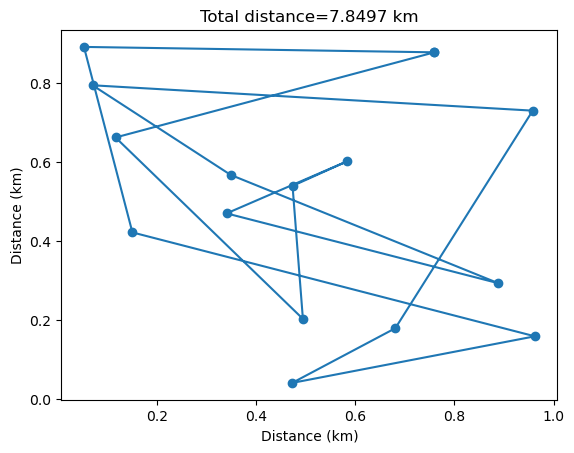

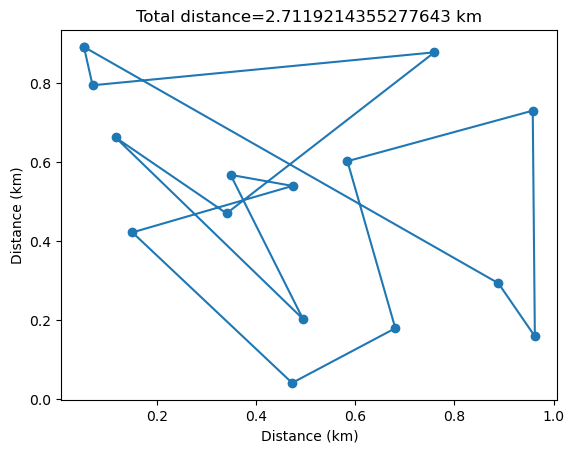

T=   0.20000 , distance=    2.71192 , accepted steps= 151


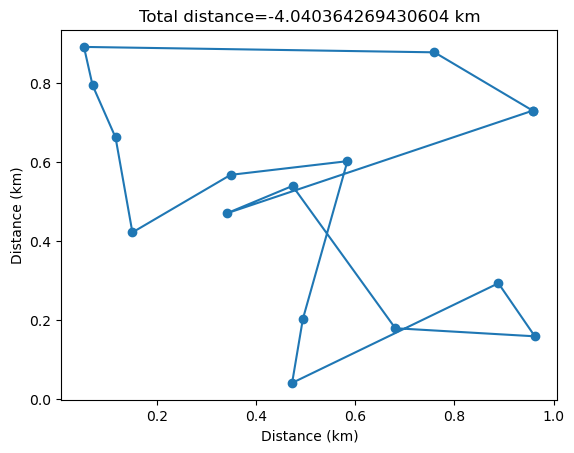

T=   0.18000 , distance=   -4.04036 , accepted steps= 151


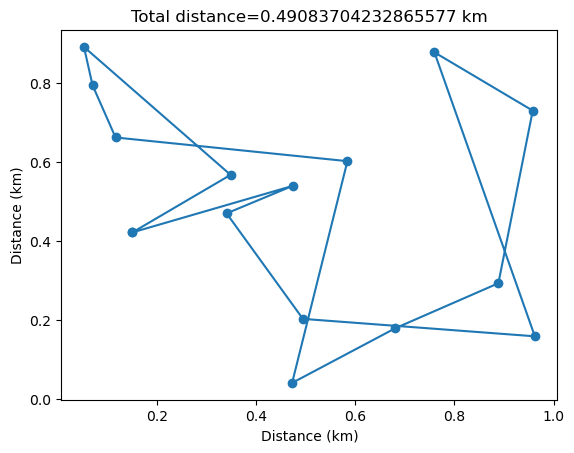

T=   0.16200 , distance=    0.49084 , accepted steps= 151


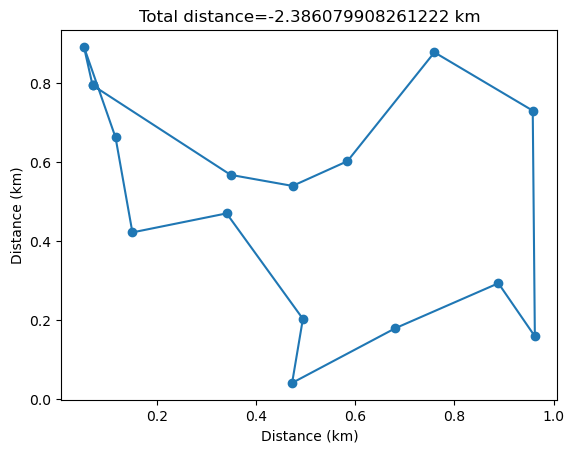

T=   0.14580 , distance=   -2.38608 , accepted steps= 151


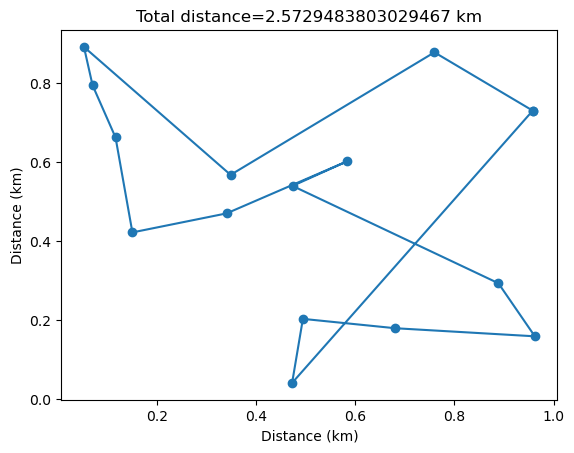

T=   0.13122 , distance=    2.57295 , accepted steps= 151


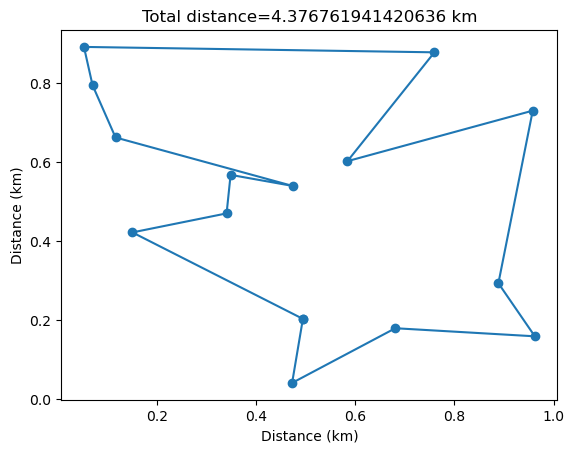

T=   0.11810 , distance=    4.37676 , accepted steps= 148


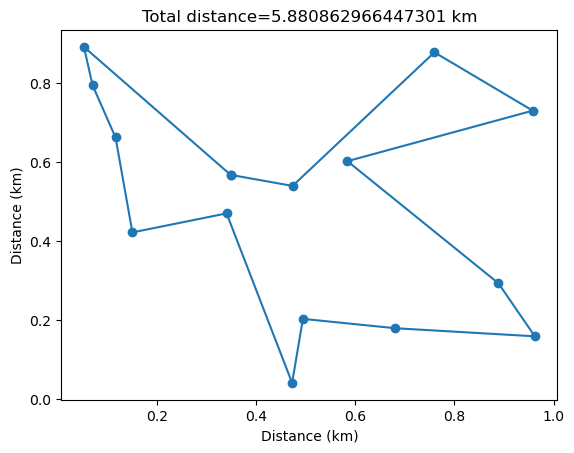

T=   0.10629 , distance=    5.88086 , accepted steps= 116


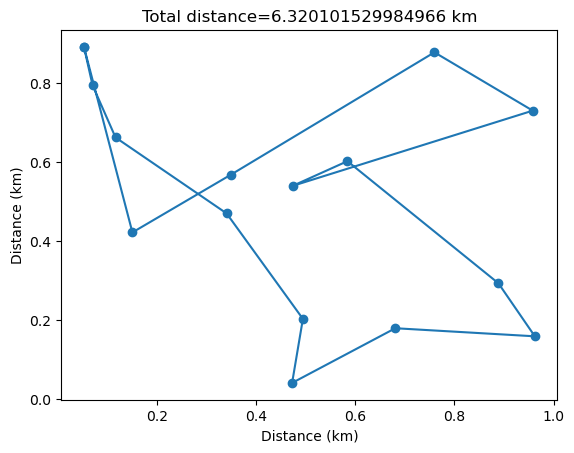

T=   0.09566 , distance=    6.32010 , accepted steps= 110


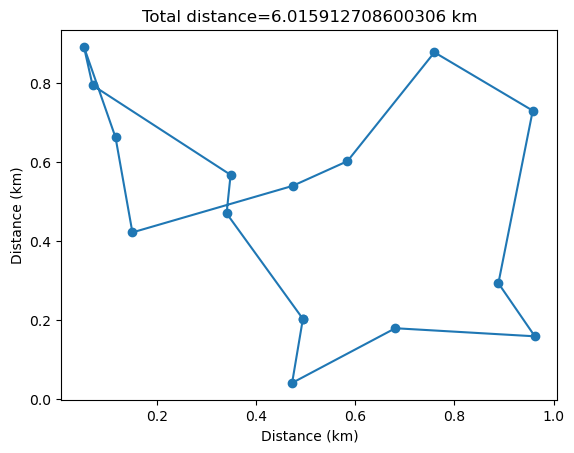

T=   0.08609 , distance=    6.01591 , accepted steps= 93


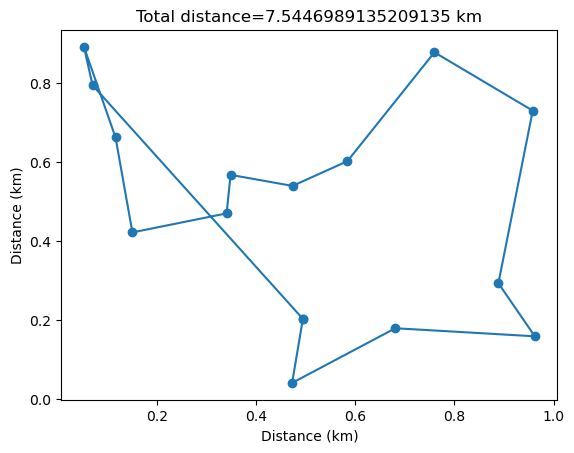

T=   0.07748 , distance=    7.54470 , accepted steps= 55


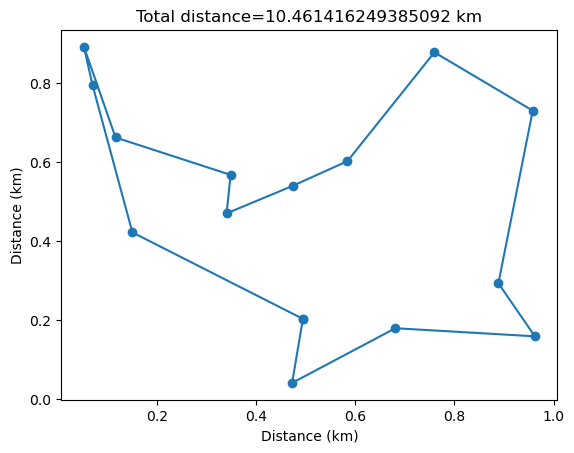

T=   0.06974 , distance=   10.46142 , accepted steps= 62


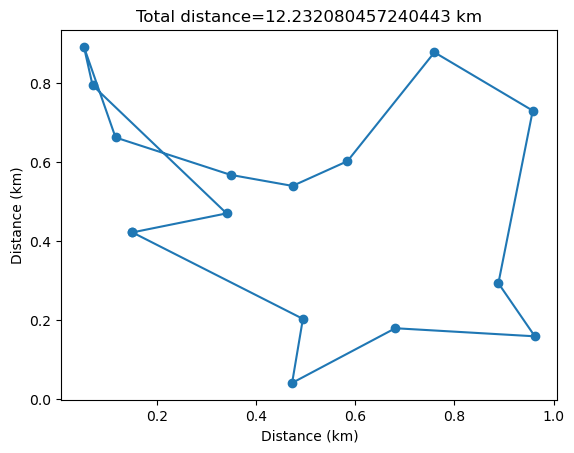

T=   0.06276 , distance=   12.23208 , accepted steps= 47


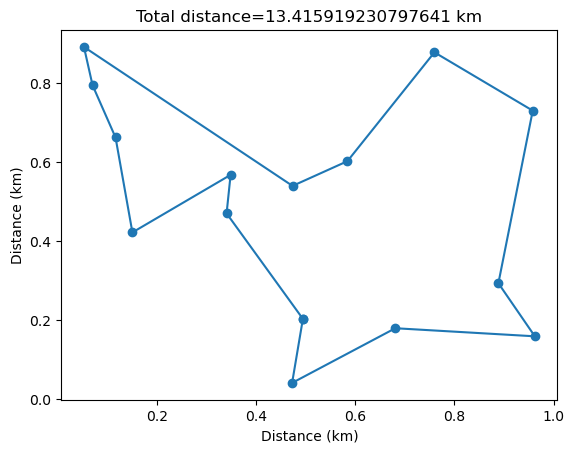

T=   0.05649 , distance=   13.41592 , accepted steps= 43


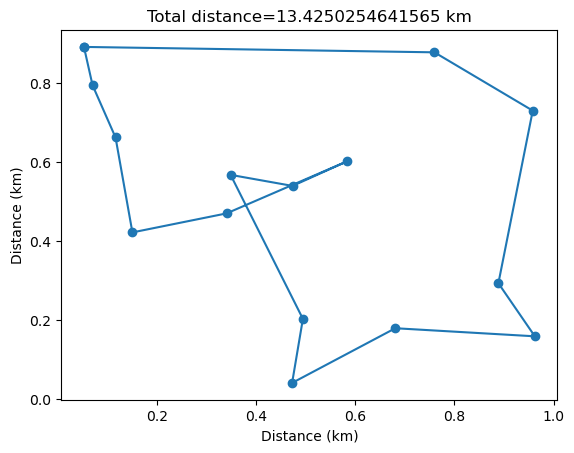

T=   0.05084 , distance=   13.42503 , accepted steps= 70


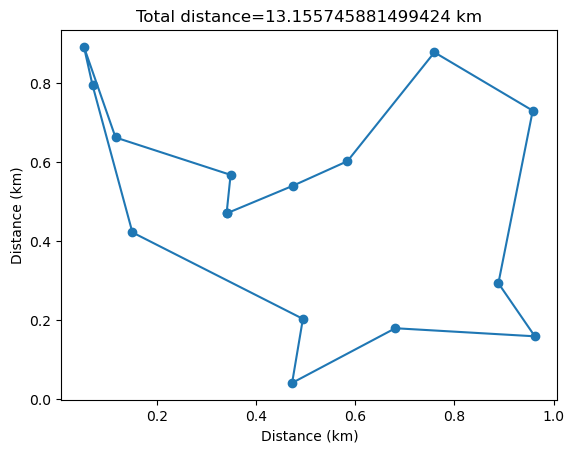

T=   0.04575 , distance=   13.15575 , accepted steps= 35


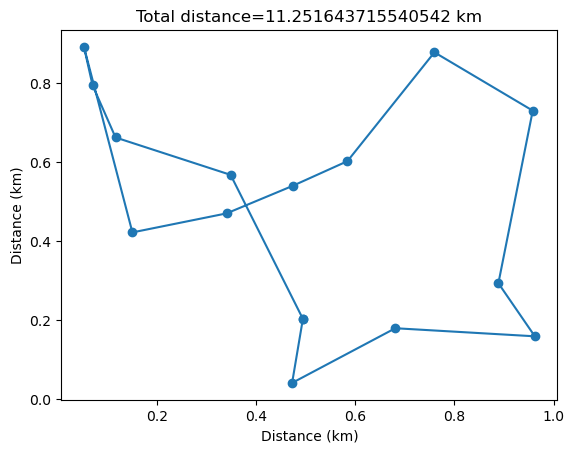

T=   0.04118 , distance=   11.25164 , accepted steps= 45


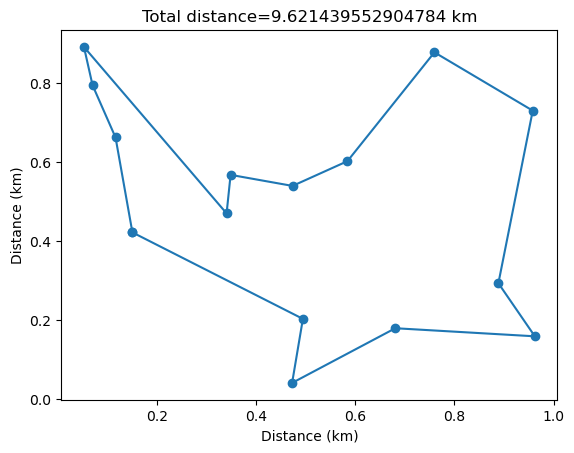

T=   0.03706 , distance=    9.62144 , accepted steps= 51


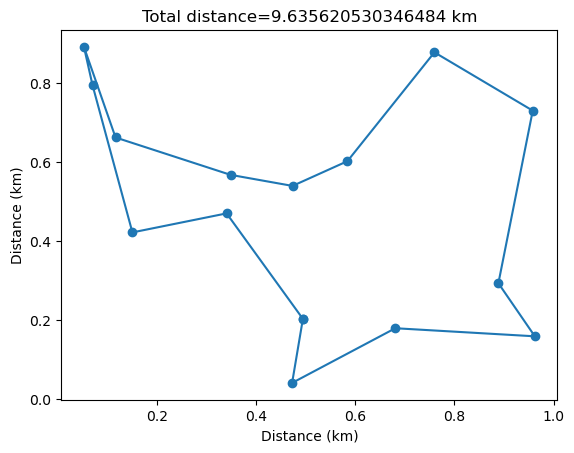

T=   0.03335 , distance=    9.63562 , accepted steps= 35


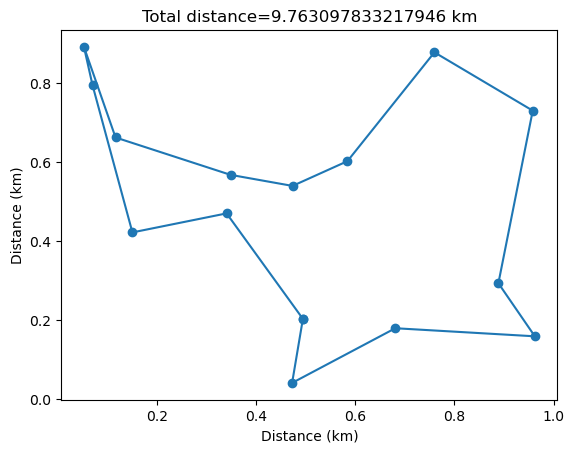

T=   0.03002 , distance=    9.76310 , accepted steps= 15


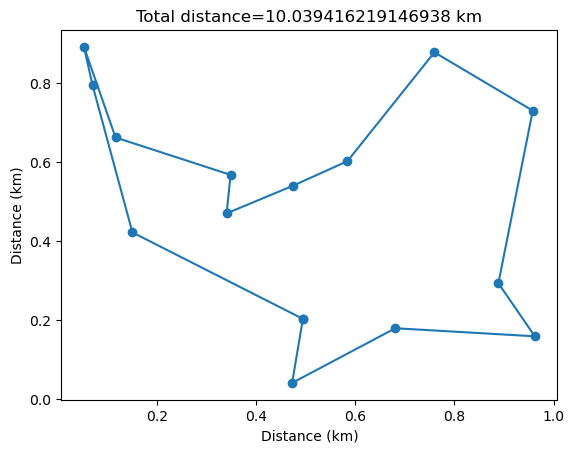

T=   0.02702 , distance=   10.03942 , accepted steps= 27


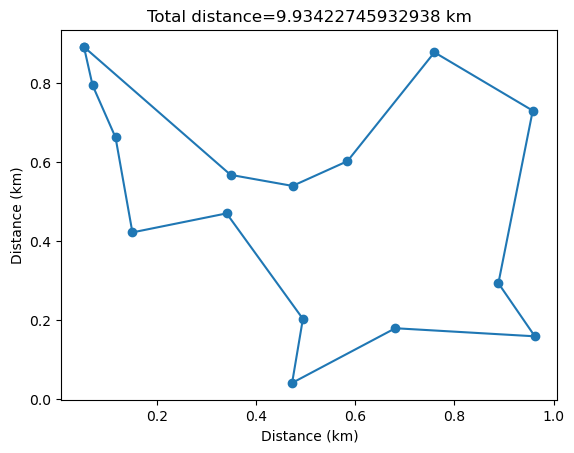

T=   0.02432 , distance=    9.93423 , accepted steps= 13


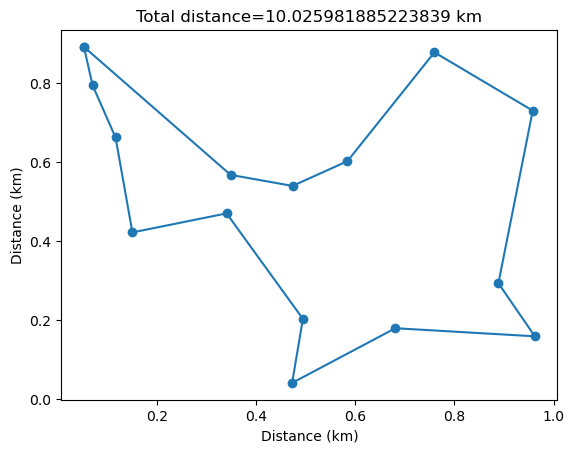

T=   0.02188 , distance=   10.02598 , accepted steps= 5


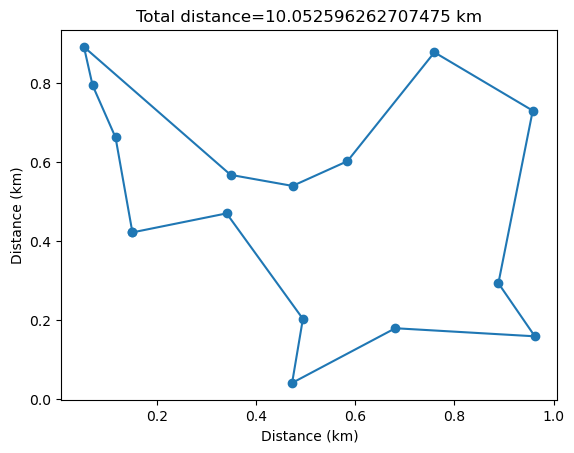

T=   0.01970 , distance=   10.05260 , accepted steps= 8


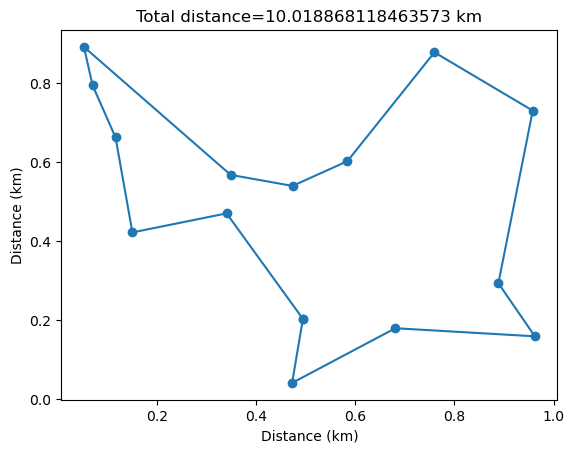

T=   0.01773 , distance=   10.01887 , accepted steps= 11


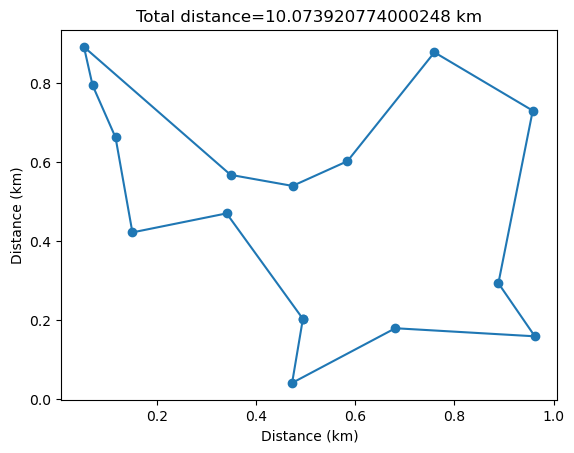

T=   0.01595 , distance=   10.07392 , accepted steps= 3


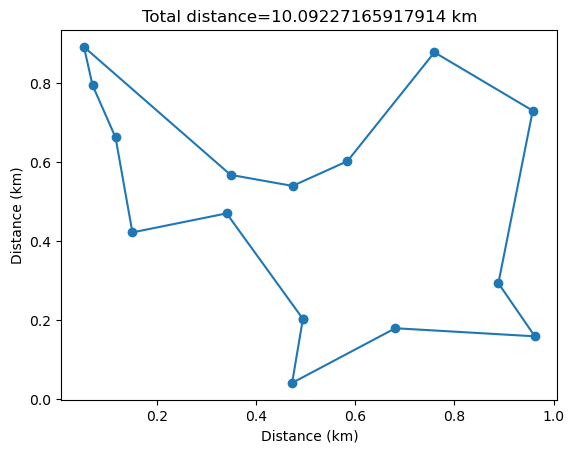

T=   0.01436 , distance=   10.09227 , accepted steps= 1


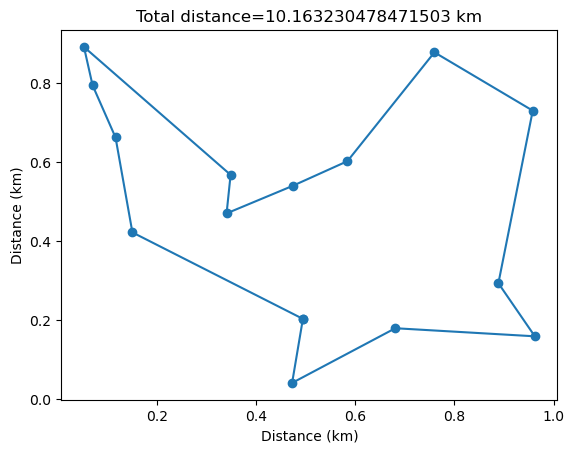

T=   0.01292 , distance=   10.16323 , accepted steps= 3


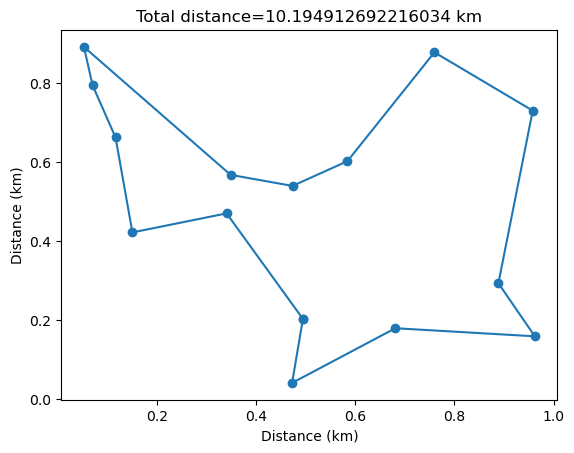

T=   0.01163 , distance=   10.19491 , accepted steps= 4


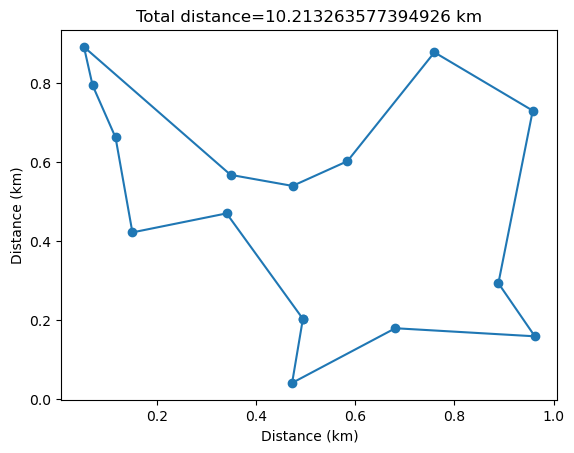

T=   0.01047 , distance=   10.21326 , accepted steps= 1


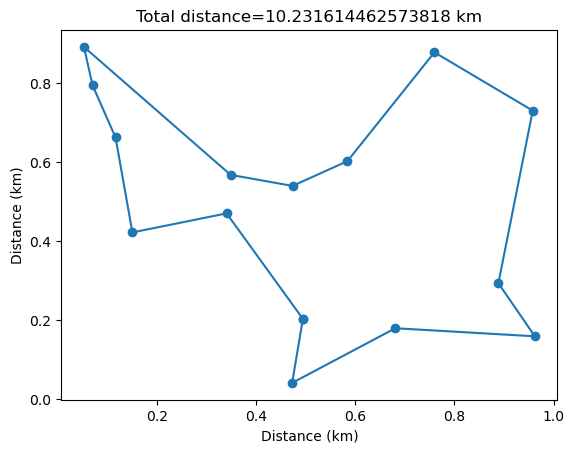

T=   0.00942 , distance=   10.23161 , accepted steps= 1


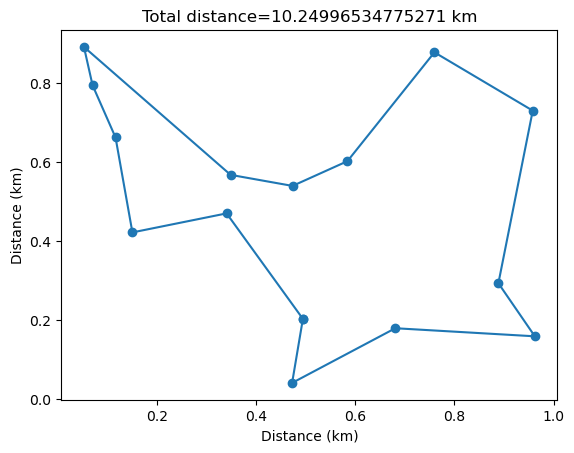

T=   0.00848 , distance=   10.24997 , accepted steps= 1


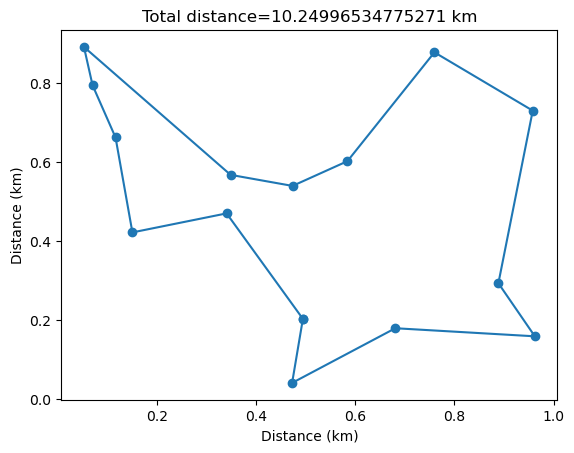

T=   0.00763 , distance=   10.24997 , accepted steps= 0


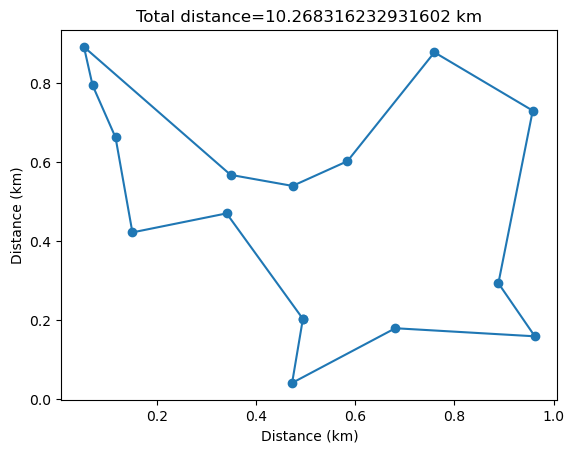

T=   0.00687 , distance=   10.26832 , accepted steps= 1


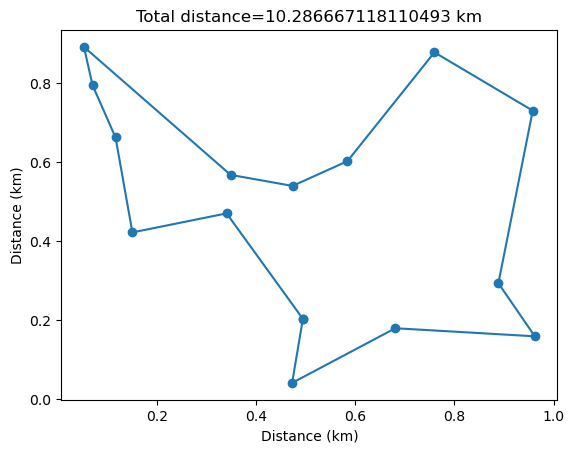

T=   0.00618 , distance=   10.28667 , accepted steps= 1


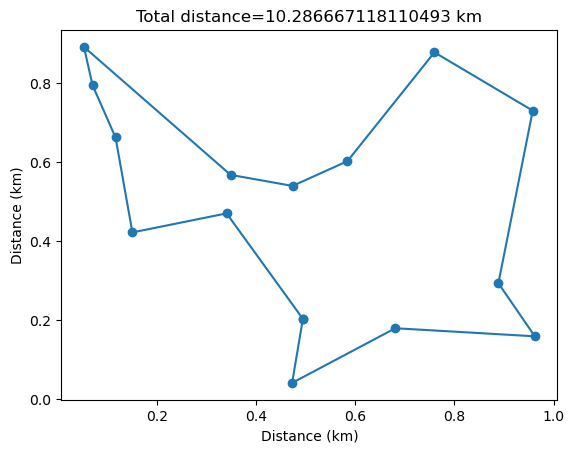

T=   0.00556 , distance=   10.28667 , accepted steps= 0


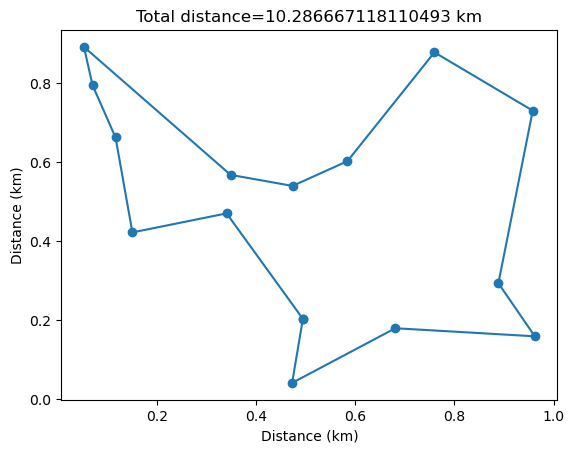

T=   0.00501 , distance=   10.28667 , accepted steps= 0


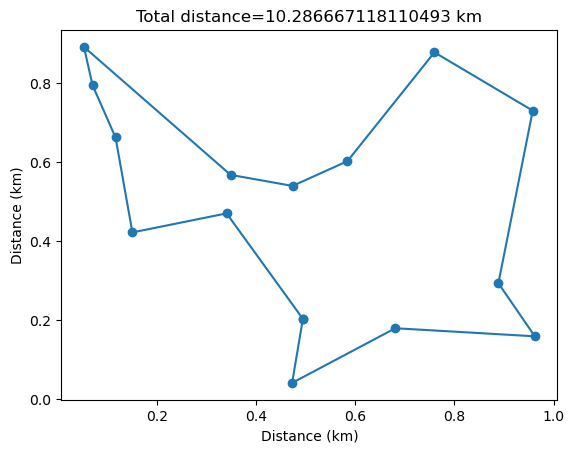

T=   0.00451 , distance=   10.28667 , accepted steps= 0


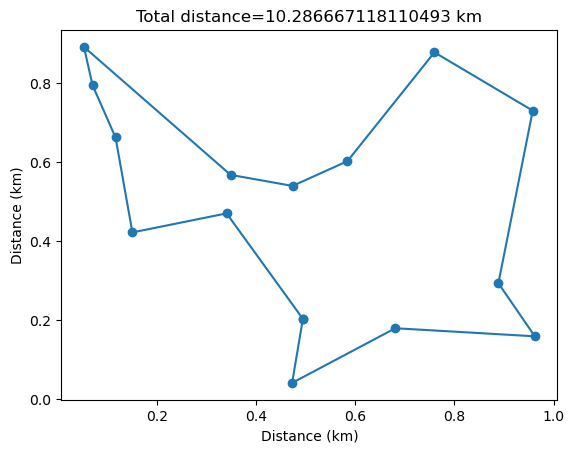

T=   0.00406 , distance=   10.28667 , accepted steps= 0


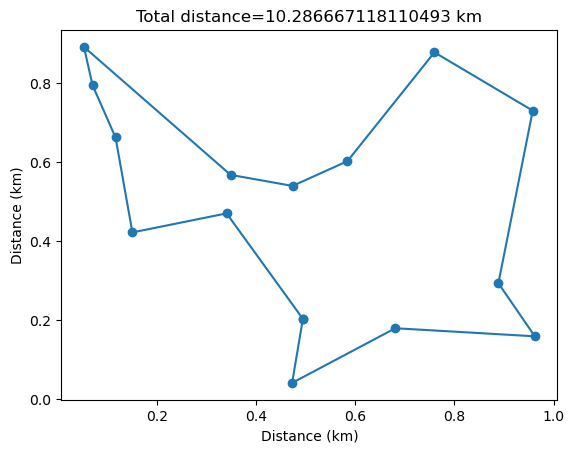

T=   0.00365 , distance=   10.28667 , accepted steps= 0


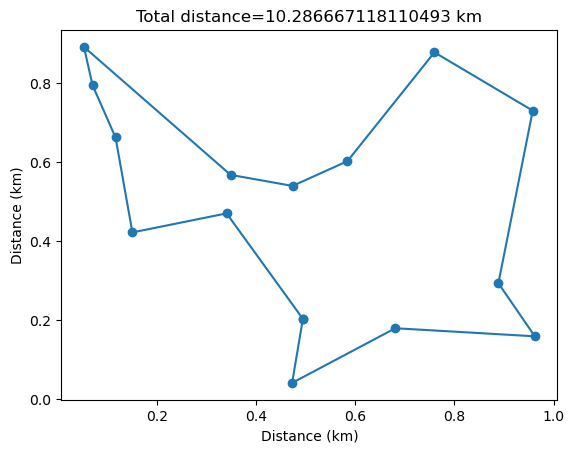

T=   0.00328 , distance=   10.28667 , accepted steps= 0


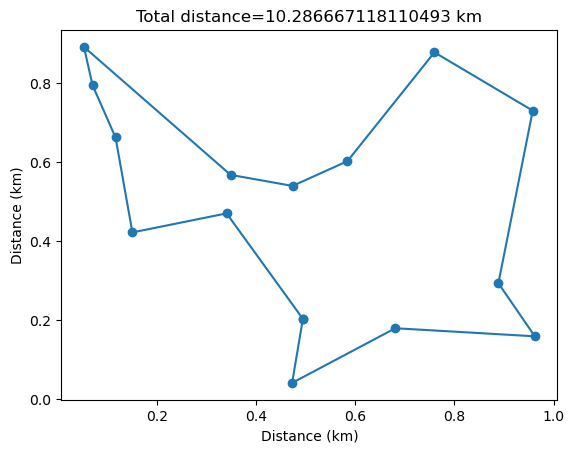

T=   0.00296 , distance=   10.28667 , accepted steps= 0


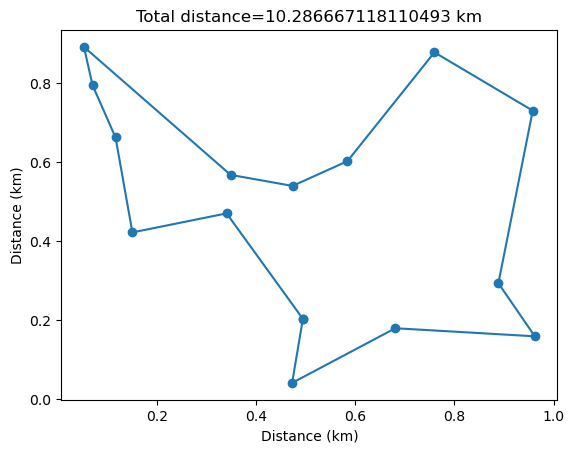

T=   0.00266 , distance=   10.28667 , accepted steps= 0


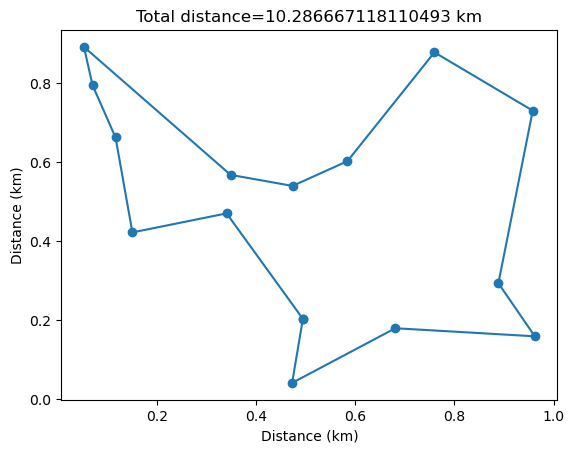

T=   0.00239 , distance=   10.28667 , accepted steps= 0


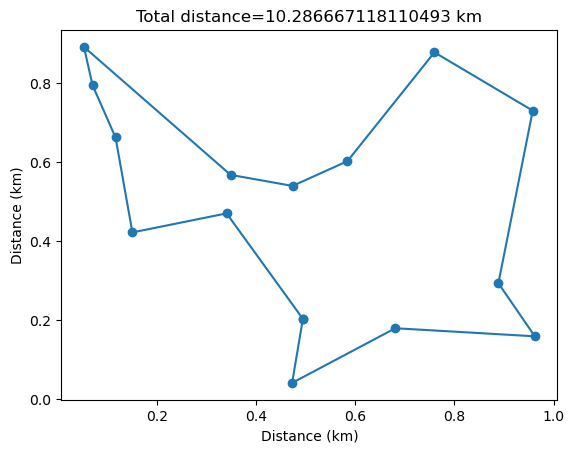

T=   0.00216 , distance=   10.28667 , accepted steps= 0
Converged after 43 iterations.


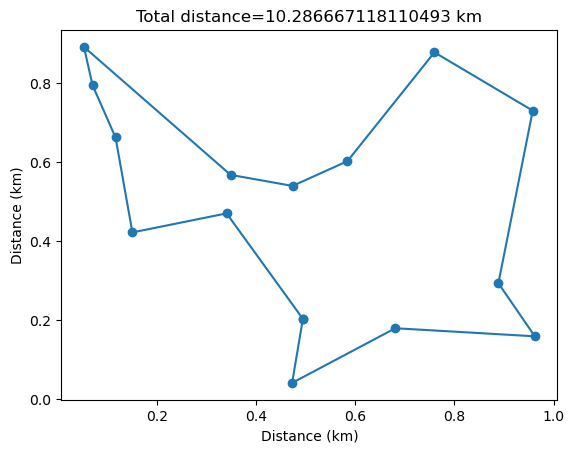

runTime:  18.277347564697266


<Figure size 640x480 with 0 Axes>

In [60]:
import time
from scipy import *
from pylab import *

start_time = time.time()

def Distance(R1, R2):
    return sqrt((R1[0] - R2[0]) ** 2 + (R1[1] - R2[1]) ** 2)

def TotalDistance(city, R):
    dist = 0
    for i in range(len(city) - 1):
        dist += Distance(R[city[i]], R[city[i + 1]])
    dist += Distance(R[city[-1]], R[city[0]])
    return dist

def reverse(city, n):
    nct = len(city)
    nn = (1 + ((n[1] - n[0]) % nct)) / 2  
    inty = int(nn)
    for j in range(inty):
        k = (n[0] + j) % nct
        l = (n[1] - j) % nct
        city[k], city[l] = city[k], city[l]

def transpt(city, n):
    nct = len(city)
    newcity = []
    for j in range((n[1] - n[0]) % nct + 1):
        newcity.append(city[(j + n[0]) % nct])
    for j in range((n[2] - n[5]) % nct + 1):
        newcity.append(city[(j + n[5]) % nct])
    for j in range((n[4] - n[3]) % nct + 1):
        newcity.append(city[(j + n[3]) % nct])
    return newcity

COUNT = 0

def Plot(city, R, dist):
    global COUNT
    Pt = [R[city[i]] for i in range(len(city))]
    Pt += [R[city[0]]]
    Pt = array(Pt)
    title('Total distance=' + str(dist) + ' km')
    plot(Pt[:, 0], Pt[:, 1], '-o')
    fig1 = gcf()
    plt.xlabel('Distance (km)')
    plt.ylabel('Distance (km)')
    plt.show()  # Display the plot before saving
    fig1.savefig('annealStep' + str(COUNT) + '.png')
    plt.clf()  # Clear the current figure after saving
    COUNT += 1

if __name__ == '__main__':
    ncity = 15  # Number of cities to visit
    maxTsteps = 50  # Temperature is lowered not more than maxTsteps
    Tstart = 0.2  # Starting temperature
    fCool = 0.9  # Factor to multiply temperature at each cooling step
    Preverse = 0.5  # Probability for reverse/transpose trial move
    convergence_threshold = 10  # Number of iterations with no change to consider convergence

    # Choosing city coordinates
    R = []  # Coordinates of cities are chosen randomly
    for i in range(ncity):
        R.append([rand(), rand()])
    R = array(R)

    # The index table -- the order the cities are visited.
    ncity = len(R)
    maxSteps = 100 * ncity  # Number of steps at constant temperature
    maxAccepted = 10 * ncity  # Number of accepted steps at constant temperature

    city = list(range(ncity))

    # Distance of the travel at the beginning
    dist = TotalDistance(city, R)
    dist = round(dist, 5)

    # Stores points of a move
    n = zeros(6, dtype=int)
    nct = len(R)  # Number of cities

    T = Tstart  # Temperature

    Plot(city, R, dist)

    # Track previous distance to check for convergence
    prev_dist = dist
    unchanged_count = 0  # Counter for consecutive iterations with no change

    for t in range(maxTsteps):  # Over temperature
        accepted = 0
        for i in range(maxSteps):  # At each temperature, many Monte Carlo steps
            while True:  # Will find two random cities sufficiently close by
                n[0] = int((nct) * rand())  # Select one city
                n[1] = int((nct - 1) * rand())  # Select another city, but not the same
                if n[1] >= n[0]:
                    n[1] += 1
                if n[1] < n[0]:
                    n[0], n[1] = n[1], n[0]  # Swap, because it must be: n[0]<n[1]
                nn = (n[0] + nct - n[1] - 1) % nct  # Number of cities not on the segment n[0]..n[1]
                if nn >= 3:
                    break

            n[2] = (n[0] - 1) % nct  # Index before n0
            n[3] = (n[1] + 1) % nct  # Index after n2

            if Preverse > rand():
                # Reverse a segment
                de = Distance(R[city[n[2]]], R[city[n[1]]]) + Distance(R[city[n[3]]], R[city[n[0]]]) - Distance(
                    R[city[n[2]]], R[city[n[0]]]) - Distance(R[city[n[3]]], R[city[n[1]]])

                if de < 0 or exp(-de / T) > rand():  # Metropolis
                    accepted += 1
                    dist += de
                    reverse(city, n)
            else:
                # Transpose a segment
                nc = (n[1] + 1 + int(rand() * (nn - 1))) % nct  
                n[4] = nc
                n[5] = (nc + 1) % nct

                de = -Distance(R[city[n[1]]], R[city[n[3]]]) - Distance(R[city[n[0]]], R[city[n[2]]]) - Distance(
                    R[city[n[4]]], R[city[n[5]]])
                de += Distance(R[city[n[0]]], R[city[n[4]]]) + Distance(R[city[n[1]]], R[city[n[5]]]) + Distance(
                    R[city[n[2]]], R[city[n[3]]])

                if de < 0 or exp(-de / T) > rand():  # Metropolis
                    accepted += 1
                    dist += de
                    city = transpt(city, n)

            if accepted > maxAccepted:
                break

        # Plot
        Plot(city, R, dist)

        print("T=%10.5f , distance= %10.5f , accepted steps= %d" % (T, dist, accepted))

        # Check for convergence
        if dist == prev_dist:
            unchanged_count += 1
        else:
            unchanged_count = 0
        if unchanged_count >= convergence_threshold:  # If no change for 10 iterations, consider converged
            print("Converged after", t, "iterations.")
            break

        prev_dist = dist
        T *= fCool  # The system is cooled down

    Plot(city, R, dist)

runTime = time.time() - start_time
print("runTime: ", runTime)


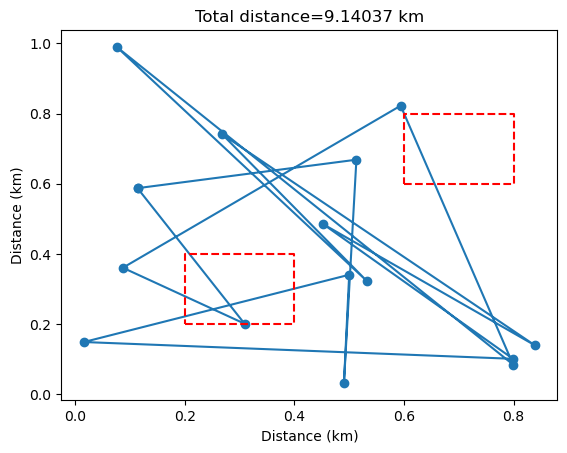

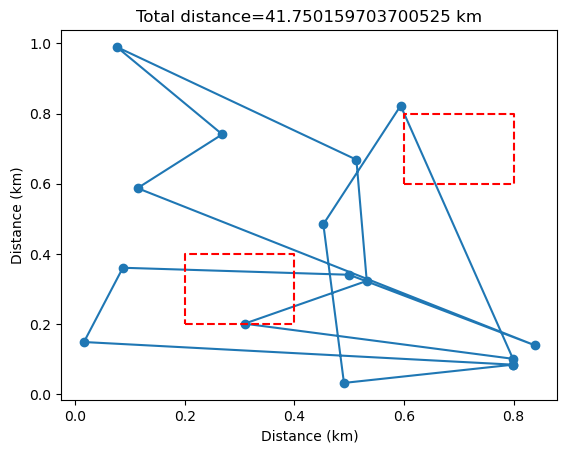

T=   0.50000 , distance=   41.75016 , accepted steps= 151


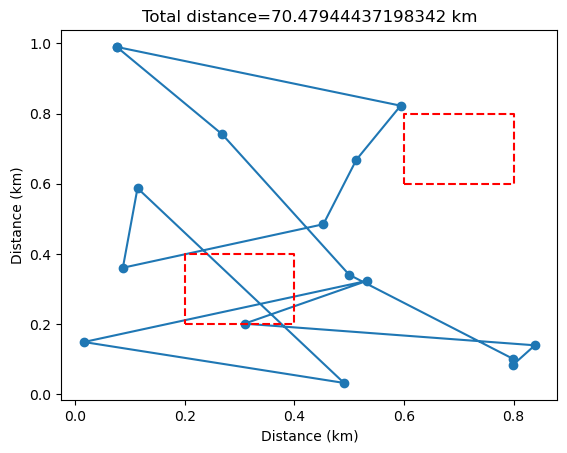

T=   0.47500 , distance=   70.47944 , accepted steps= 151


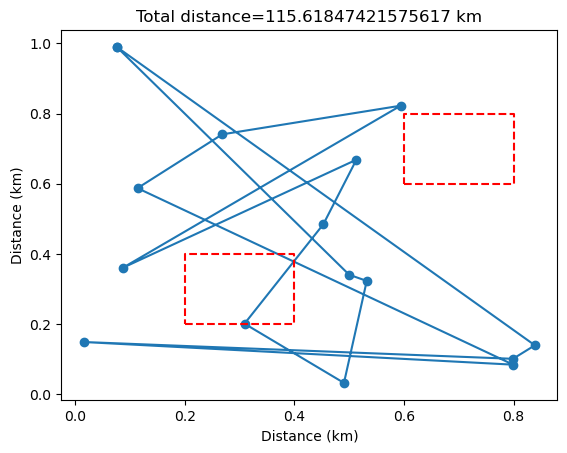

T=   0.45125 , distance=  115.61847 , accepted steps= 151


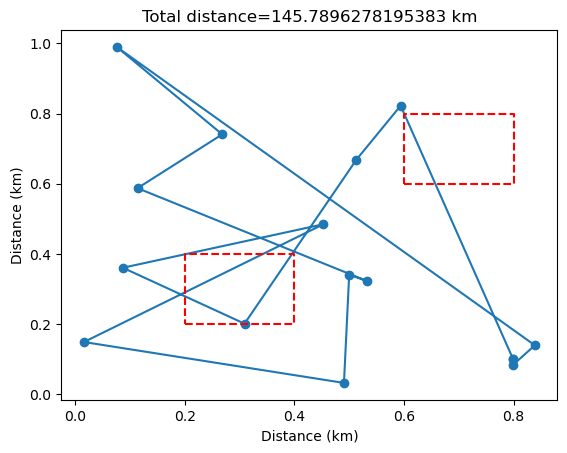

T=   0.42869 , distance=  145.78963 , accepted steps= 151


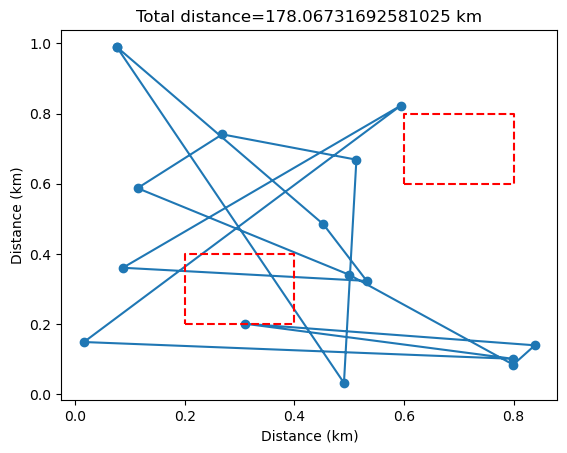

T=   0.40725 , distance=  178.06732 , accepted steps= 151


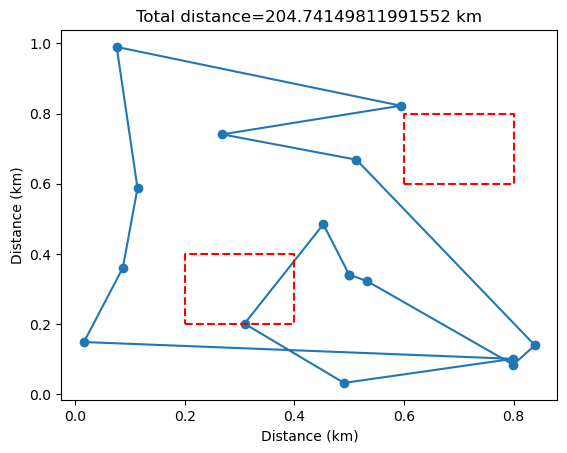

T=   0.38689 , distance=  204.74150 , accepted steps= 151


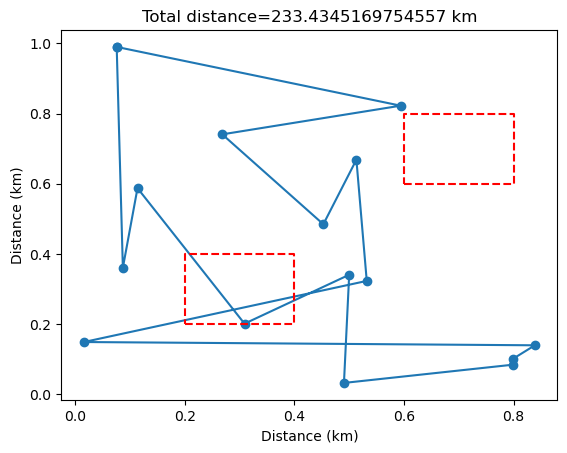

T=   0.36755 , distance=  233.43452 , accepted steps= 151


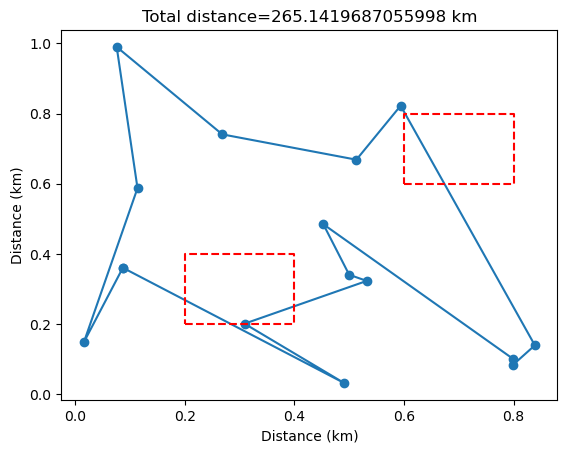

T=   0.34917 , distance=  265.14197 , accepted steps= 151


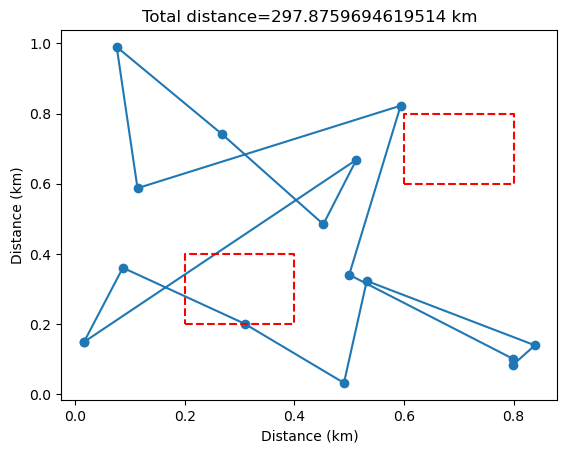

T=   0.33171 , distance=  297.87597 , accepted steps= 151


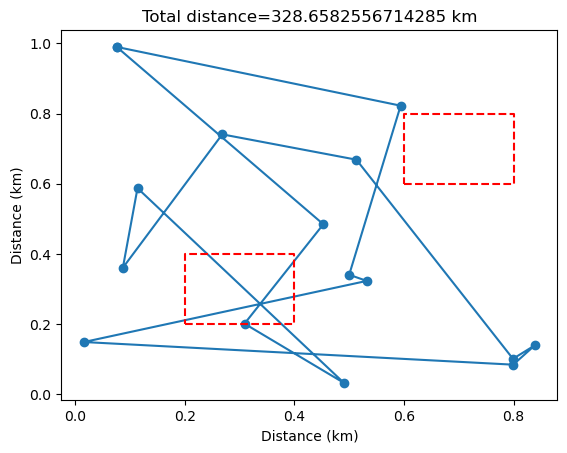

T=   0.31512 , distance=  328.65826 , accepted steps= 151


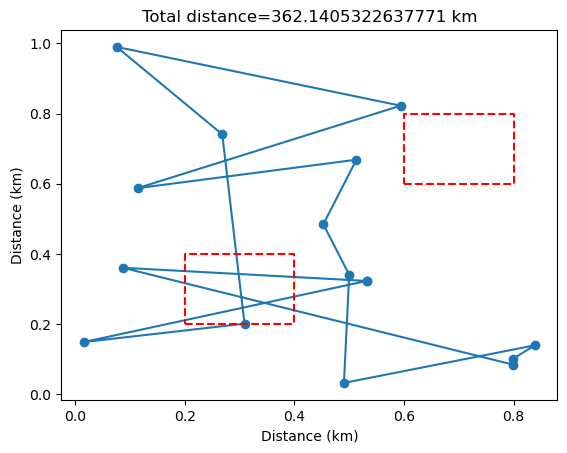

T=   0.29937 , distance=  362.14053 , accepted steps= 151


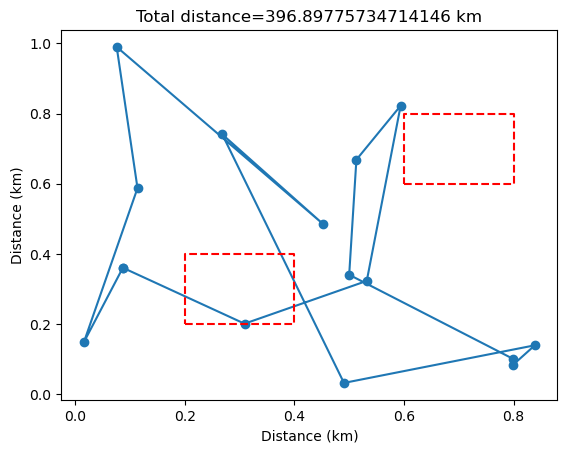

T=   0.28440 , distance=  396.89776 , accepted steps= 151


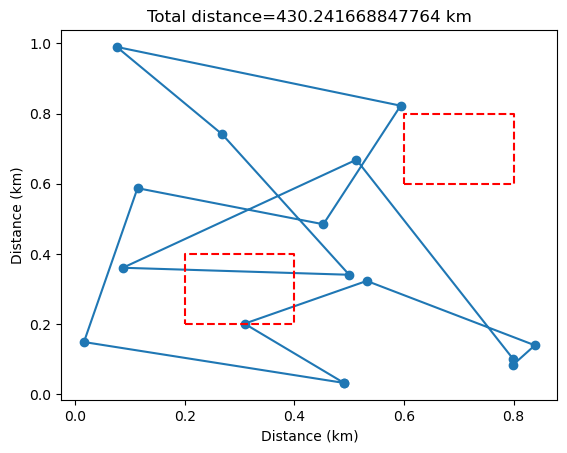

T=   0.27018 , distance=  430.24167 , accepted steps= 151


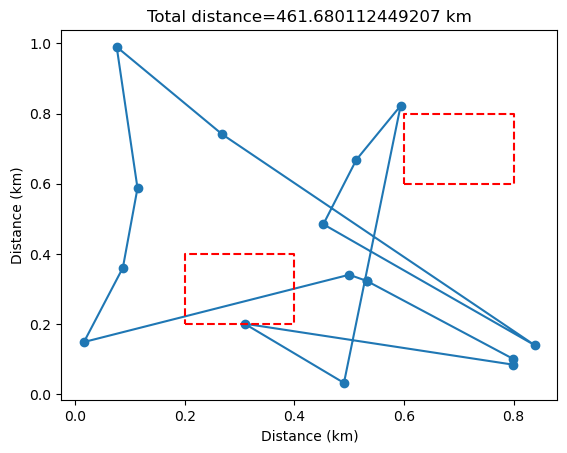

T=   0.25667 , distance=  461.68011 , accepted steps= 151


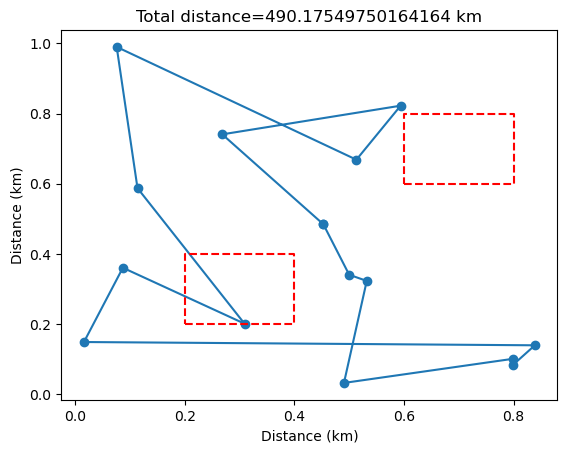

T=   0.24384 , distance=  490.17550 , accepted steps= 151


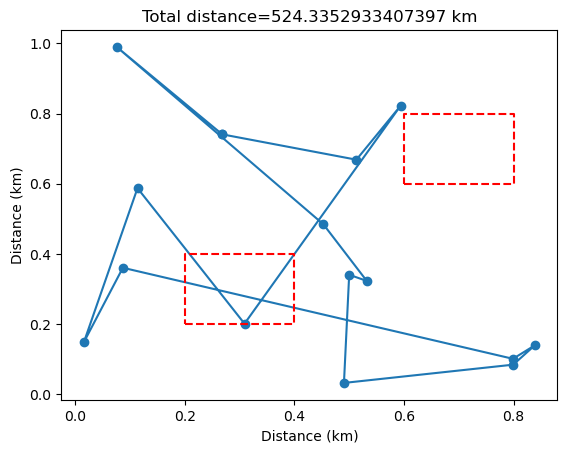

T=   0.23165 , distance=  524.33529 , accepted steps= 151


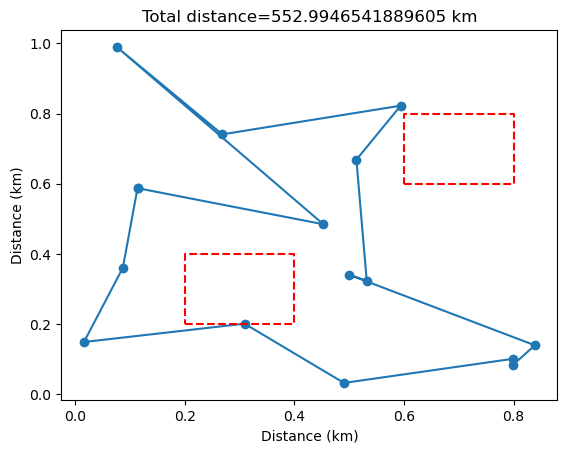

T=   0.22006 , distance=  552.99465 , accepted steps= 151


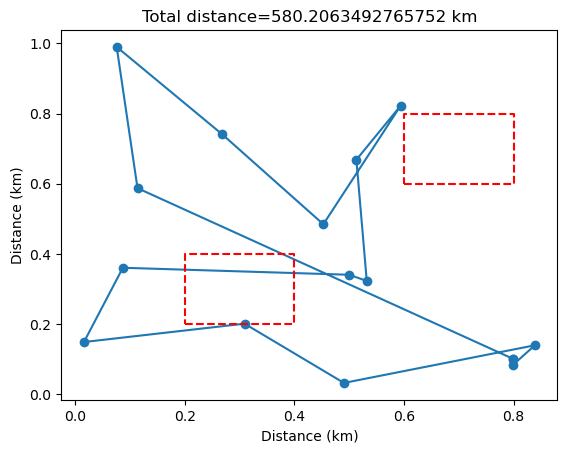

T=   0.20906 , distance=  580.20635 , accepted steps= 151


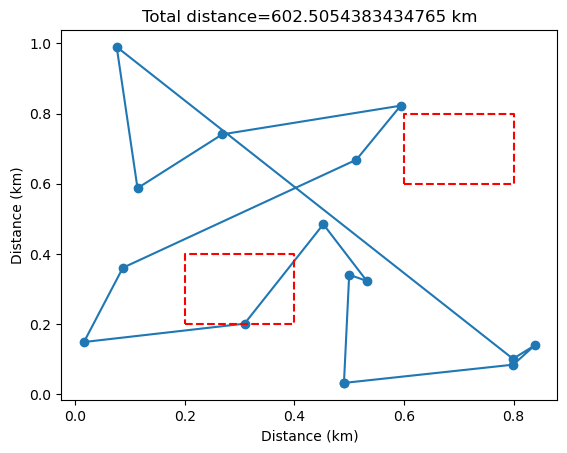

T=   0.19861 , distance=  602.50544 , accepted steps= 146


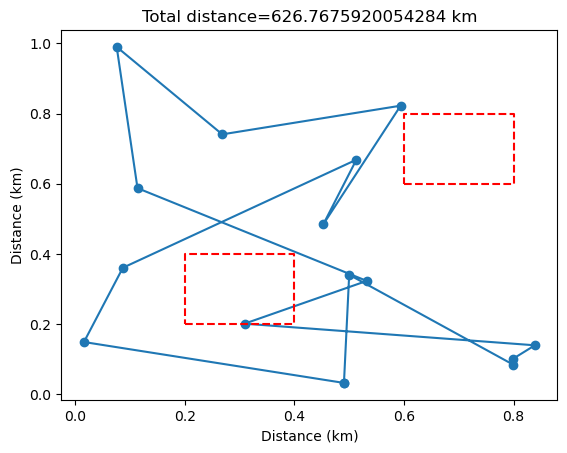

T=   0.18868 , distance=  626.76759 , accepted steps= 124


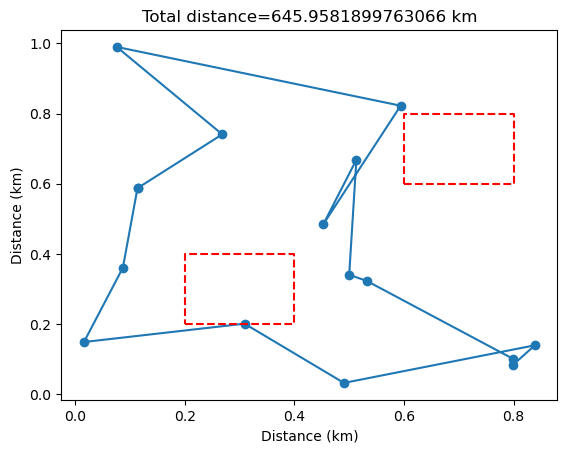

T=   0.17924 , distance=  645.95819 , accepted steps= 107


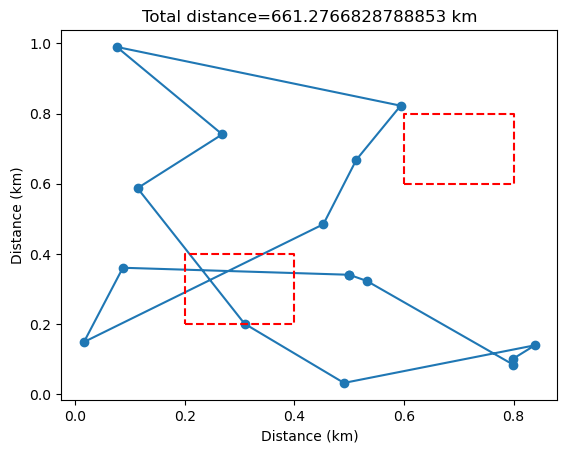

T=   0.17028 , distance=  661.27668 , accepted steps= 72


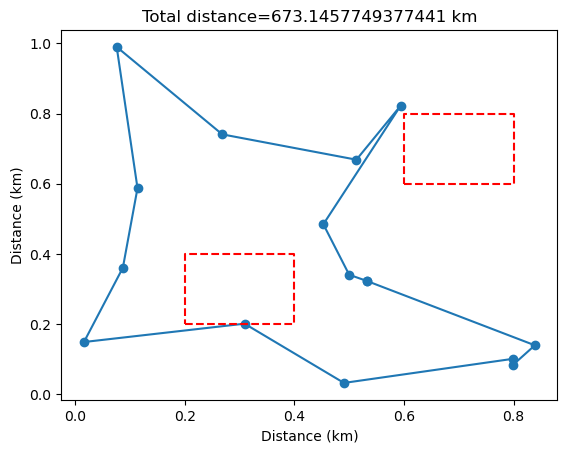

T=   0.16177 , distance=  673.14577 , accepted steps= 78


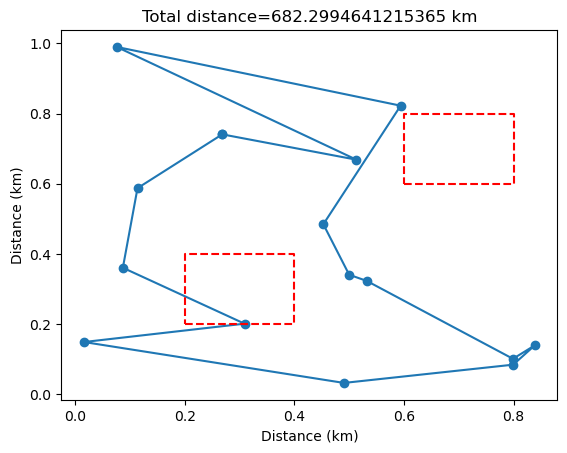

T=   0.15368 , distance=  682.29946 , accepted steps= 47


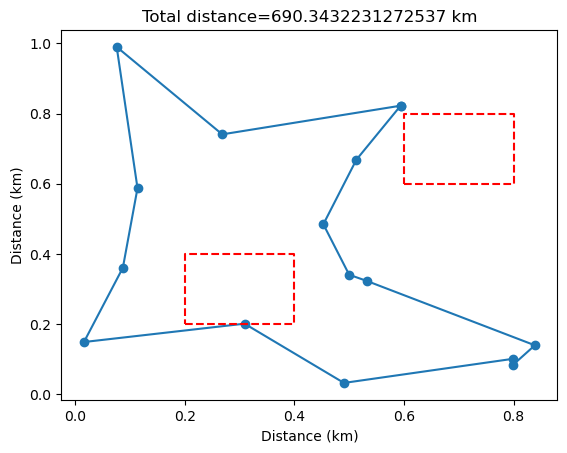

T=   0.14599 , distance=  690.34322 , accepted steps= 39


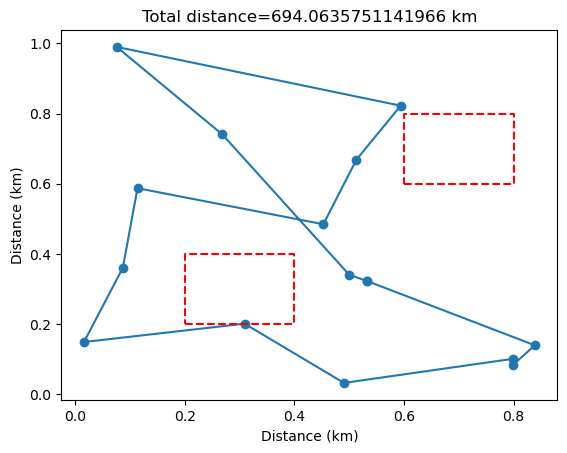

T=   0.13869 , distance=  694.06358 , accepted steps= 15


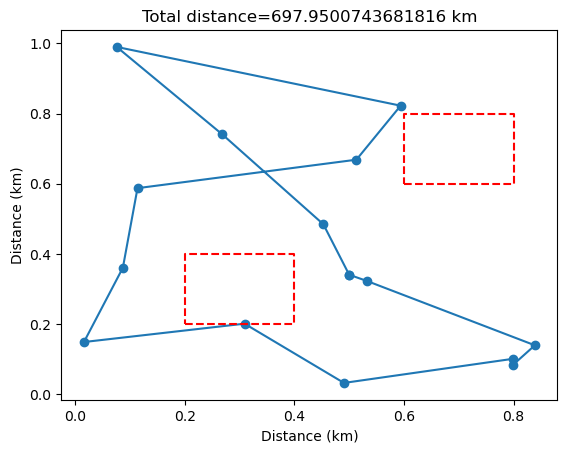

T=   0.13176 , distance=  697.95007 , accepted steps= 21


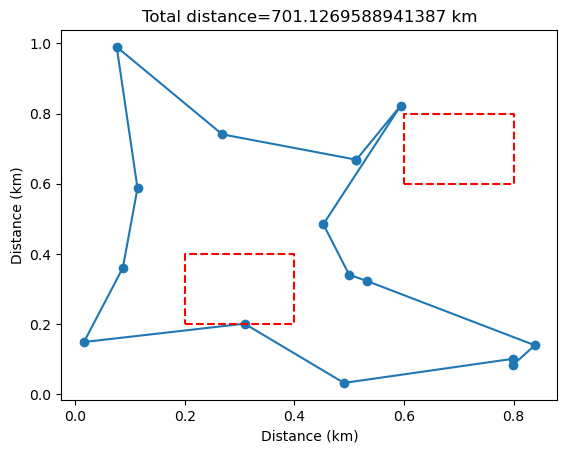

T=   0.12517 , distance=  701.12696 , accepted steps= 27


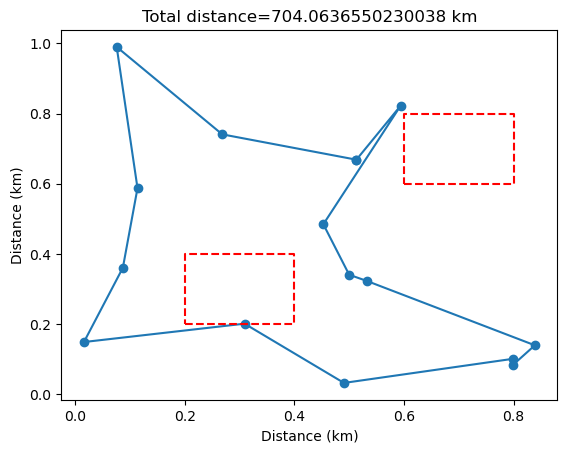

T=   0.11891 , distance=  704.06366 , accepted steps= 8


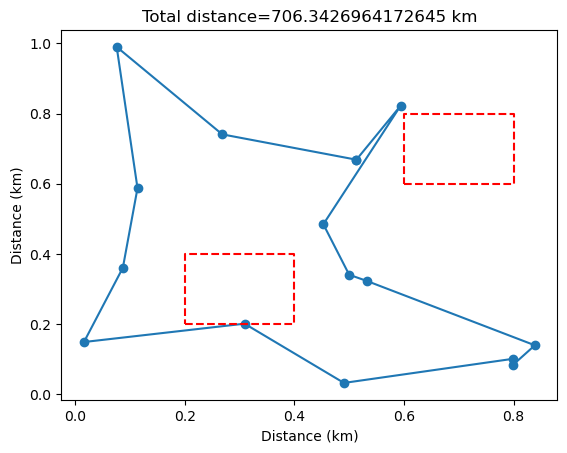

T=   0.11297 , distance=  706.34270 , accepted steps= 8


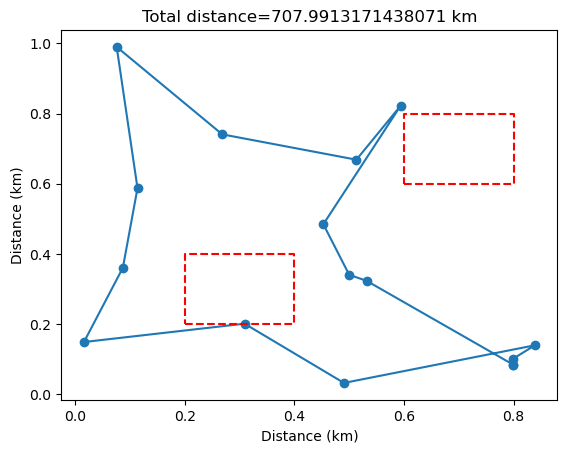

T=   0.10732 , distance=  707.99132 , accepted steps= 8


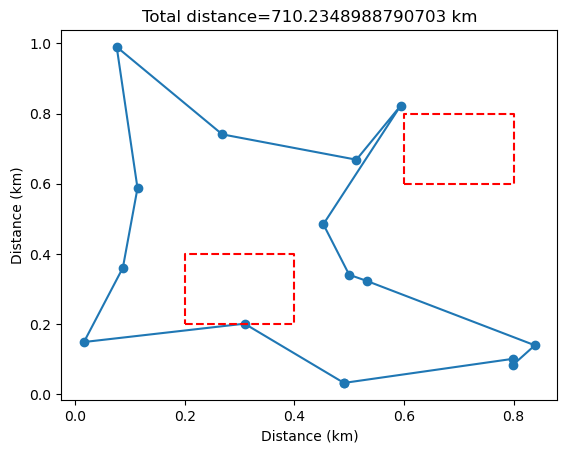

T=   0.10195 , distance=  710.23490 , accepted steps= 11


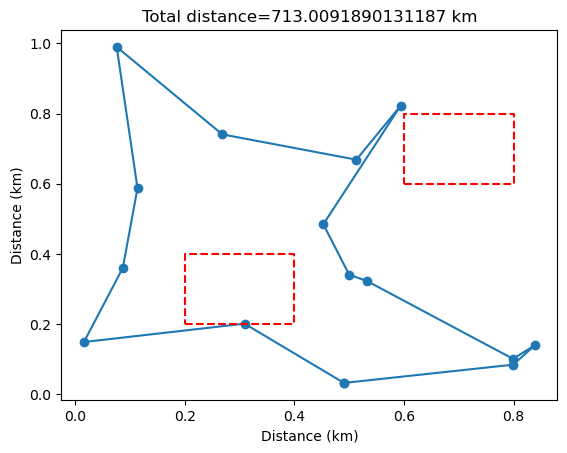

T=   0.09686 , distance=  713.00919 , accepted steps= 15


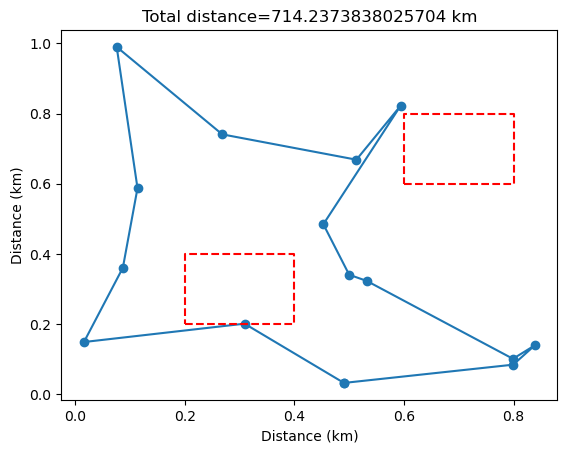

T=   0.09201 , distance=  714.23738 , accepted steps= 8


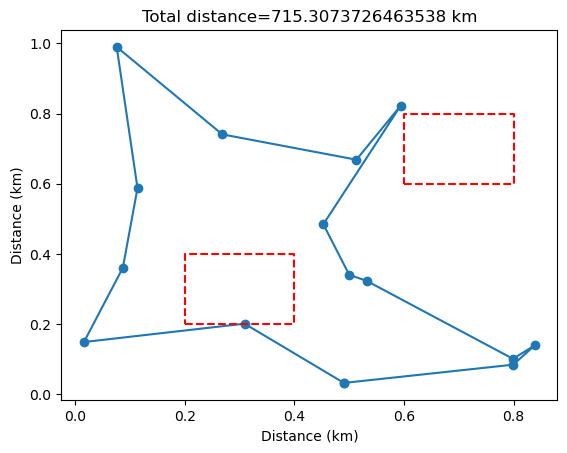

T=   0.08741 , distance=  715.30737 , accepted steps= 7


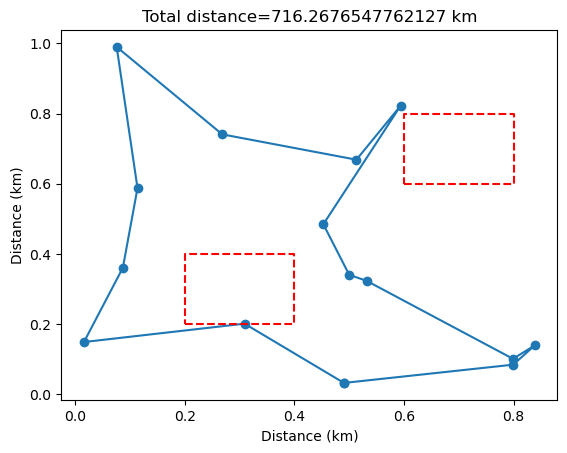

T=   0.08304 , distance=  716.26765 , accepted steps= 7


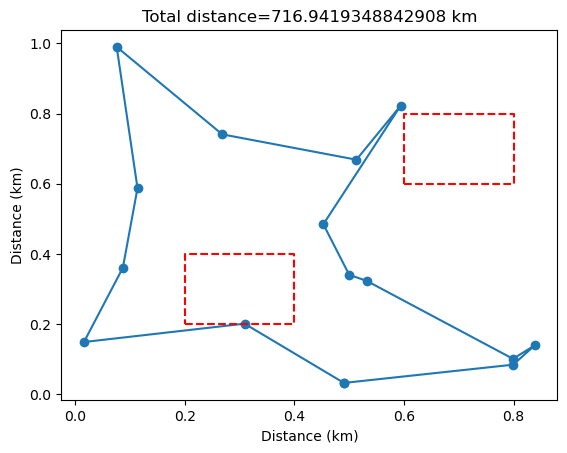

T=   0.07889 , distance=  716.94193 , accepted steps= 3


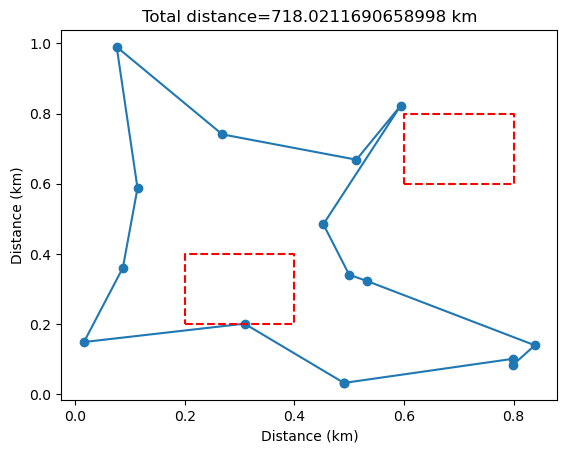

T=   0.07495 , distance=  718.02117 , accepted steps= 6


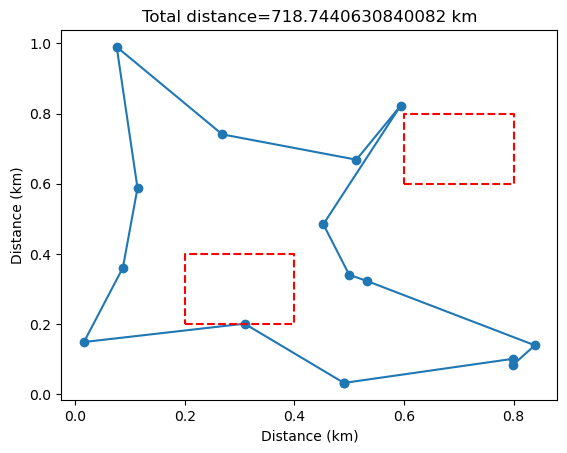

T=   0.07120 , distance=  718.74406 , accepted steps= 2


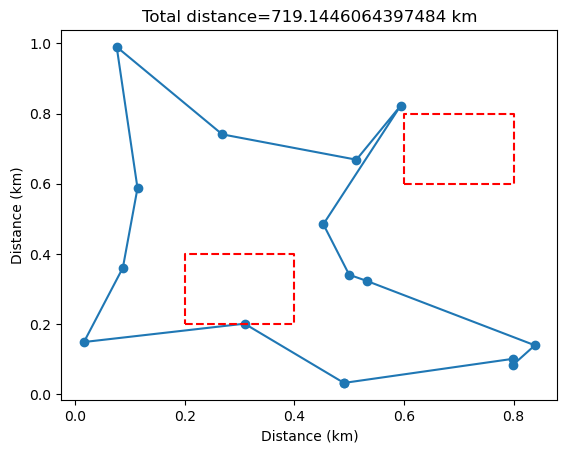

T=   0.06764 , distance=  719.14461 , accepted steps= 3


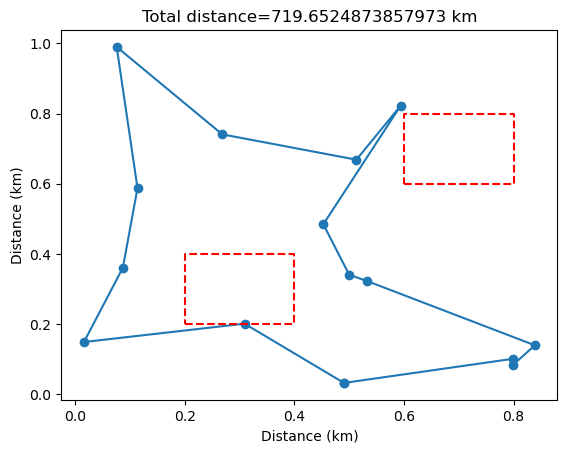

T=   0.06426 , distance=  719.65249 , accepted steps= 3


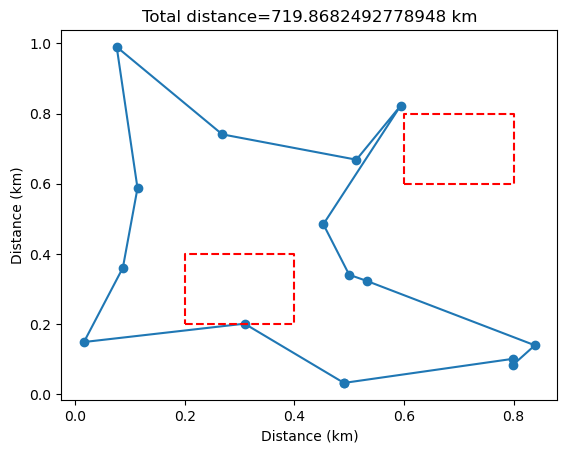

T=   0.06104 , distance=  719.86825 , accepted steps= 2


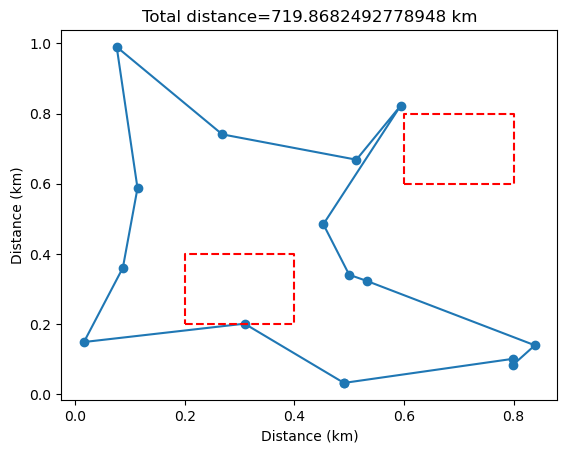

T=   0.05799 , distance=  719.86825 , accepted steps= 0


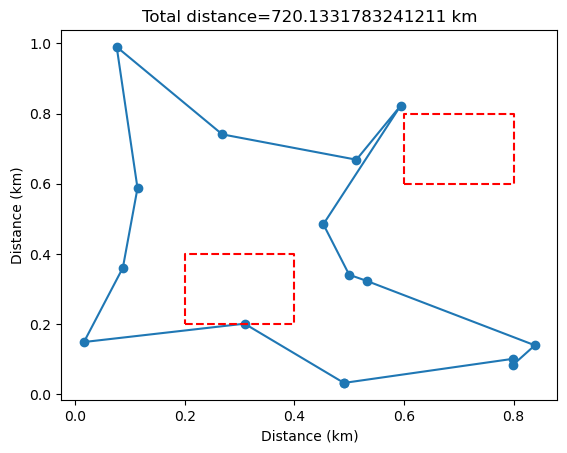

T=   0.05509 , distance=  720.13318 , accepted steps= 1


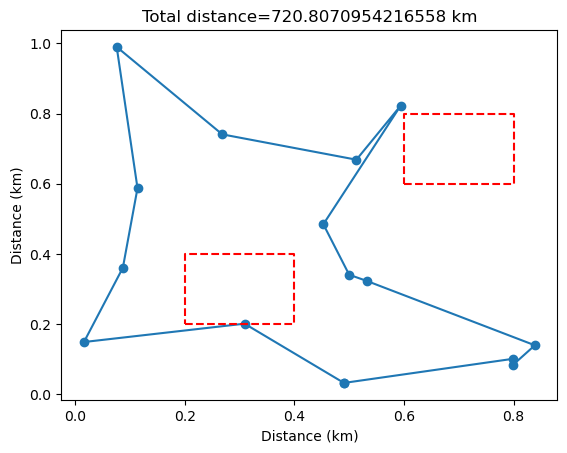

T=   0.05234 , distance=  720.80710 , accepted steps= 3


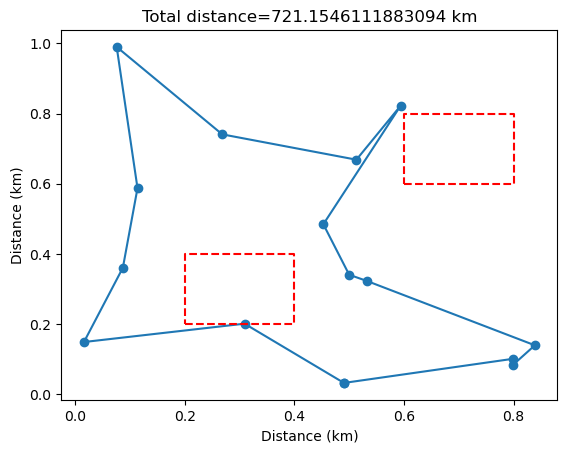

T=   0.04972 , distance=  721.15461 , accepted steps= 2


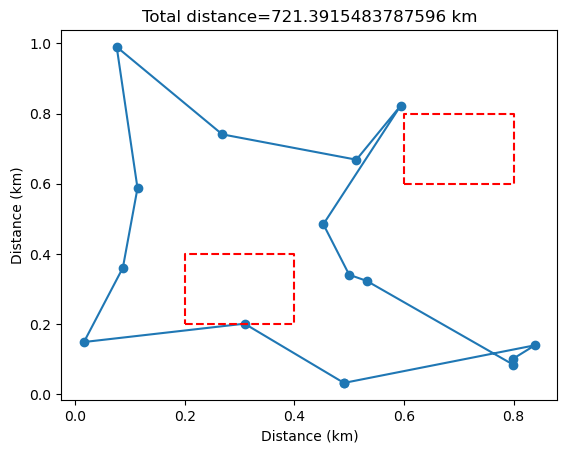

T=   0.04723 , distance=  721.39155 , accepted steps= 1


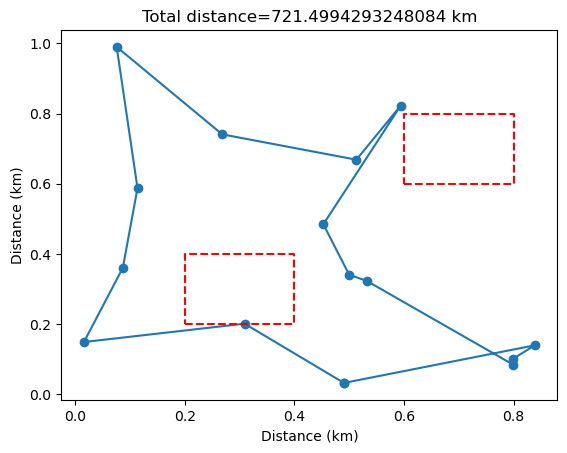

T=   0.04487 , distance=  721.49943 , accepted steps= 1


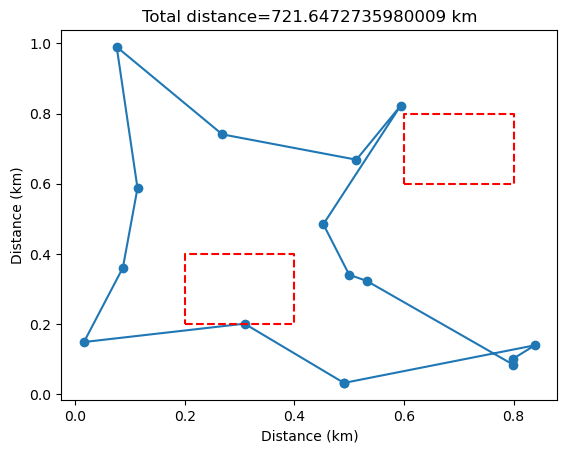

T=   0.04263 , distance=  721.64727 , accepted steps= 1


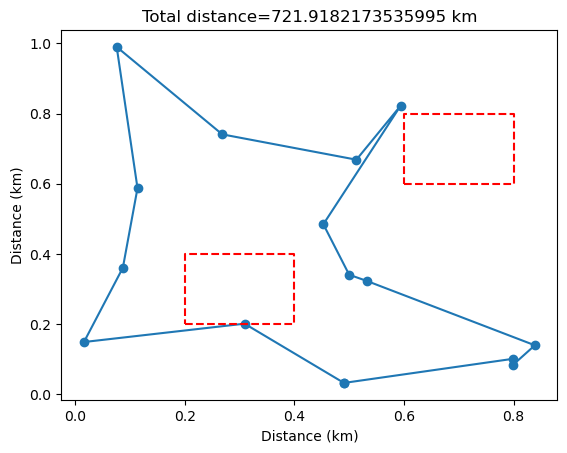

T=   0.04050 , distance=  721.91822 , accepted steps= 2


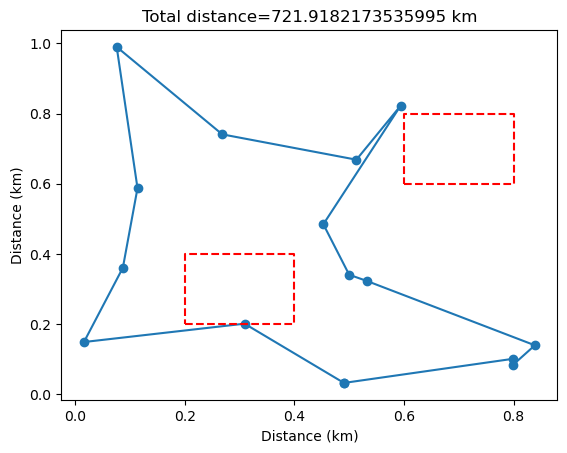

runTime:  35.651429414749146


<Figure size 640x480 with 0 Axes>

In [134]:
import time
from scipy import *
from pylab import *
import random

start_time = time.time()

def Distance(R1, R2):
    return sqrt((R1[0] - R2[0]) ** 2 + (R1[1] - R2[1]) ** 2)

def TotalDistance(city, R):
    dist = 0
    for i in range(len(city) - 1):
        dist += Distance(R[city[i]], R[city[i + 1]])
    dist += Distance(R[city[-1]], R[city[0]])
    return dist

def CalculateObstaclePenalty(city, R, obstacles):
    obstacle_penalty = 0
    for i in range(len(city) - 1):
        for obstacle in obstacles:
            if LineIntersectsObstacle(R[city[i]], R[city[i + 1]], obstacle):
                obstacle_penalty += 0.1  # Increment obstacle penalty for each intersection
    return obstacle_penalty

def LineIntersectsObstacle(point1, point2, obstacle):
    x1, y1 = point1
    x2, y2 = point2
    x_min, y_min, x_max, y_max = obstacle
    # Check if the line segment intersects with the rectangle defined by obstacle
    return (
        (x_min <= x1 <= x_max or x_min <= x2 <= x_max) and
        (y_min <= y1 <= y_max or y_min <= y2 <= y_max) and
        (x1 - x2) * (y_min - y_max) != (x_min - x_max) * (y1 - y2)  # Check for intersection
    )

def reverse(city, n):
    nct = len(city)
    nn = (1 + ((n[1] - n[0]) % nct)) / 2  
    inty = int(nn)
    for j in range(inty):
        k = (n[0] + j) % nct
        l = (n[1] - j) % nct
        city[k], city[l] = city[k], city[l]

def transpt(city, n):
    nct = len(city)
    newcity = []
    for j in range((n[1] - n[0]) % nct + 1):
        newcity.append(city[(j + n[0]) % nct])
    for j in range((n[2] - n[5]) % nct + 1):
        newcity.append(city[(j + n[5]) % nct])
    for j in range((n[4] - n[3]) % nct + 1):
        newcity.append(city[(j + n[3]) % nct])
    return newcity

COUNT = 0

def Plot(city, R, dist, obstacles):
    global COUNT
    Pt = [R[city[i]] for i in range(len(city))]
    Pt += [R[city[0]]]
    Pt = array(Pt)
    title('Total distance=' + str(dist) + ' km')
    plot(Pt[:, 0], Pt[:, 1], '-o')
    for obstacle in obstacles:
        x_min, y_min, x_max, y_max = obstacle
        plt.plot([x_min, x_max, x_max, x_min, x_min], [y_min, y_min, y_max, y_max, y_min], 'r--')
    fig1 = gcf()
    plt.xlabel('Distance (km)')
    plt.ylabel('Distance (km)')
    plt.show()  # Display the plot before saving
    fig1.savefig('annealStep' + str(COUNT) + '.png')
    plt.clf()  # Clear the current figure after saving
    COUNT += 1

if __name__ == '__main__':
    ncity = 15  # Number of cities to visit
    maxTsteps = 50  # Temperature is lowered not more than maxTsteps
    Tstart = 0.5  # Starting temperature
    fCool = 0.95  # Factor to multiply temperature at each cooling step
    Preverse = 0.5  # Probability for reverse/transpose trial move
    convergence_threshold = 10  # Number of iterations with no change to consider convergence

    # Define rectangular obstacles [x_min, y_min, x_max, y_max]
    obstacles = [[0.2, 0.2, 0.4, 0.4], [0.6, 0.6, 0.8, 0.8]]

    # Choosing city coordinates
    R = []  # Coordinates of cities are chosen randomly
    for i in range(ncity):
        while True:
            rand_coordinate = [random.uniform(0, 1), random.uniform(0, 1)]
            # Check if the random coordinate is inside any obstacle
            is_overlap = False
            for obstacle in obstacles:
                if LineIntersectsObstacle(rand_coordinate, rand_coordinate, obstacle):
                    is_overlap = True
                    break
            if not is_overlap:
                R.append(rand_coordinate)
                break
    R = array(R)

    # The index table -- the order the cities are visited.
    ncity = len(R)
    maxSteps = 100 * ncity  # Number of steps at constant temperature
    maxAccepted = 10 * ncity  # Number of accepted steps at constant temperature

    city = list(range(ncity))

    # Distance of the travel at the beginning
    dist = TotalDistance(city, R)
    dist = round(dist, 5)

    # Stores points of a move
    n = zeros(6, dtype=int)
    nct = len(R)  # Number of cities

    T = Tstart  # Temperature

    Plot(city, R, dist, obstacles)

    # Track previous distance to check for convergence
    prev_dist = dist
    unchanged_count = 0  # Counter for consecutive iterations with no change

    for t in range(maxTsteps):  # Over temperature
        accepted = 0
        for i in range(maxSteps):  # At each temperature, many Monte Carlo steps
            while True:  # Will find two random cities sufficiently close by
                n[0] = int((nct) * random.uniform(0, 1))  # Select one city
                n[1] = int((nct - 1) * random.uniform(0, 1))  # Select another city, but not the same
                if n[1] >= n[0]:
                    n[1] += 1
                if n[1] < n[0]:
                    n[0], n[1] = n[1], n[0]  # Swap, because it must be: n[0]<n[1]
                nn = (n[0] + nct - n[1] - 1) % nct  # Number of cities not on the segment n[0]..n[1]
                if nn >= 3:
                    break

            n[2] = (n[0] - 1) % nct  # Index before n0
            n[3] = (n[1] + 1) % nct  # Index after n2

            if Preverse > random.uniform(0, 1):
                # Reverse a segment
                de = Distance(R[city[n[2]]], R[city[n[1]]]) + Distance(R[city[n[3]]], R[city[n[0]]]) - Distance(
                    R[city[n[2]]], R[city[n[0]]]) - Distance(R[city[n[3]]], R[city[n[1]]])

                # Calculate obstacle penalty
                obstacle_penalty = CalculateObstaclePenalty(city, R, obstacles)
                de += obstacle_penalty  # Add obstacle penalty to the change in distance

                # Metropolis acceptance criterion with obstacle penalty
                if de < 0 or exp(-de / T) > random.uniform(0, 1):  # Metropolis
                    accepted += 1
                    dist += de
                    reverse(city, n)
            else:
                # Transpose a segment
                nc = (n[1] + 1 + int(random.uniform(0, 1) * (nn - 1))) % nct  
                n[4] = nc
                n[5] = (nc + 1) % nct

                de = -Distance(R[city[n[1]]], R[city[n[3]]]) - Distance(R[city[n[0]]], R[city[n[2]]]) - Distance(
                    R[city[n[4]]], R[city[n[5]]])
                de += Distance(R[city[n[0]]], R[city[n[4]]]) + Distance(R[city[n[1]]], R[city[n[5]]]) + Distance(
                    R[city[n[2]]], R[city[n[3]]])

                # Calculate obstacle penalty
                obstacle_penalty = CalculateObstaclePenalty(city, R, obstacles)
                de += obstacle_penalty  # Add obstacle penalty to the change in distance

                # Metropolis acceptance criterion with obstacle penalty
                if de < 0 or exp(-de / T) > random.uniform(0, 1):  # Metropolis
                    accepted += 1
                    dist += de
                    city = transpt(city, n)

            if accepted > maxAccepted:
                break

        # Plot
        Plot(city, R, dist, obstacles)

        print("T=%10.5f , distance= %10.5f , accepted steps= %d" % (T, dist, accepted))

        # Check for convergence
        if dist == prev_dist:
            unchanged_count += 1
        else:
            unchanged_count = 0
        if unchanged_count >= convergence_threshold:  # If no change for 10 iterations, consider converged
            print("Converged after", t, "iterations.")
            break

        prev_dist = dist
        T *= fCool  # The system is cooled down

    Plot(city, R, dist, obstacles)

runTime = time.time() - start_time
print("runTime: ", runTime)


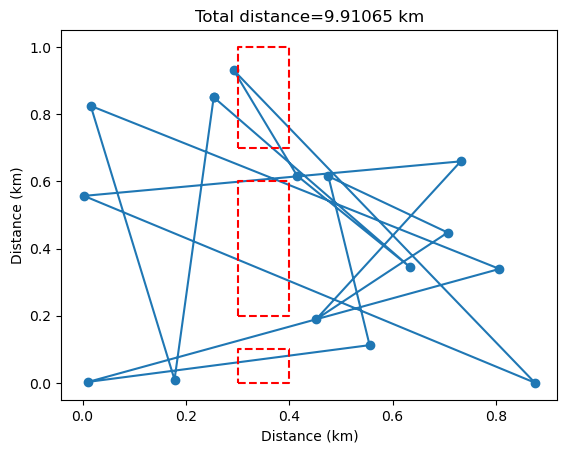

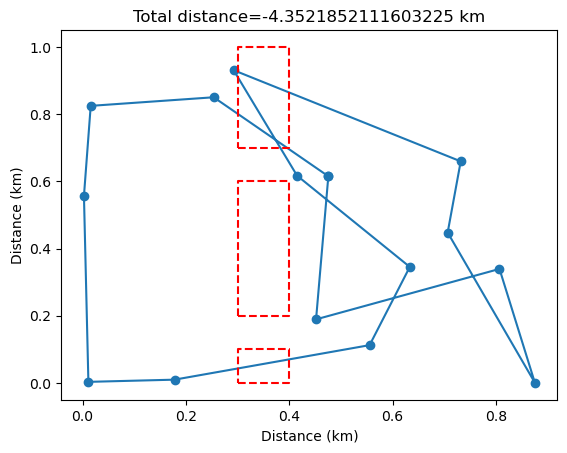

T=   0.20000 , distance=   -4.35219 , accepted steps= 151


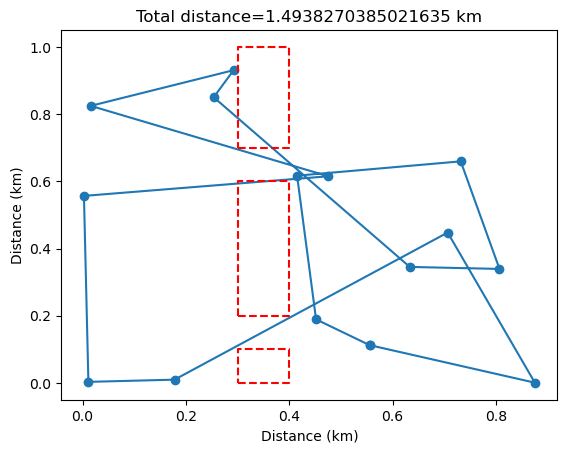

T=   0.18000 , distance=    1.49383 , accepted steps= 151


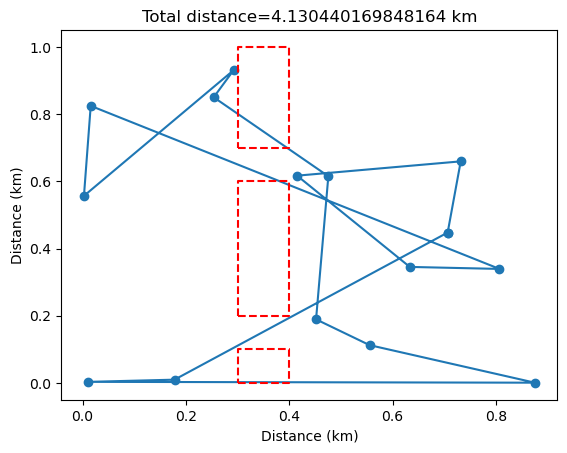

T=   0.16200 , distance=    4.13044 , accepted steps= 151


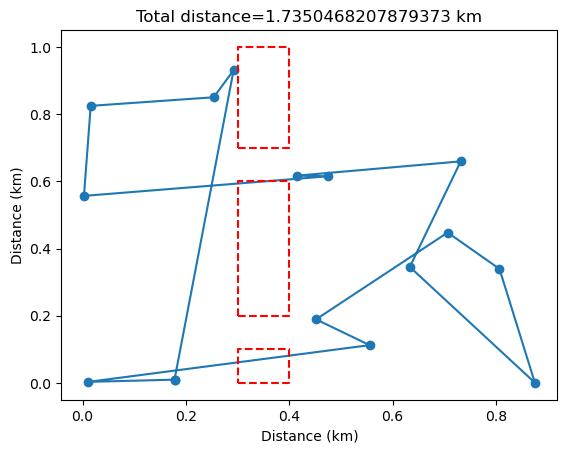

T=   0.14580 , distance=    1.73505 , accepted steps= 151


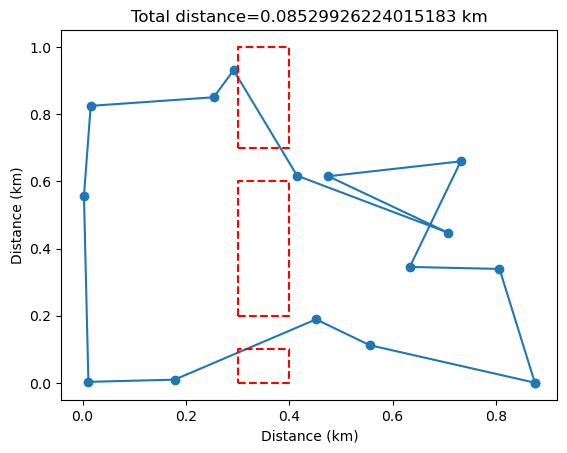

T=   0.13122 , distance=    0.08530 , accepted steps= 137


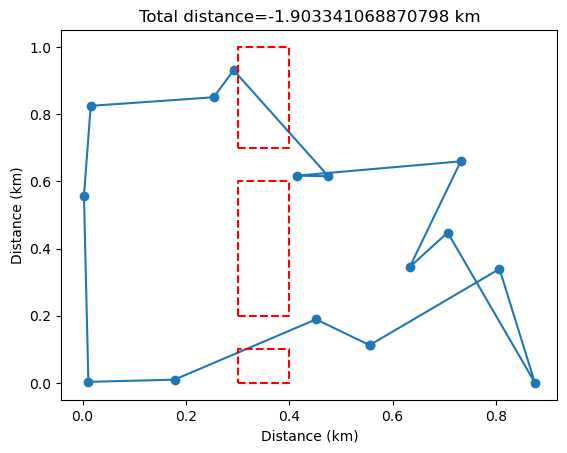

T=   0.11810 , distance=   -1.90334 , accepted steps= 116


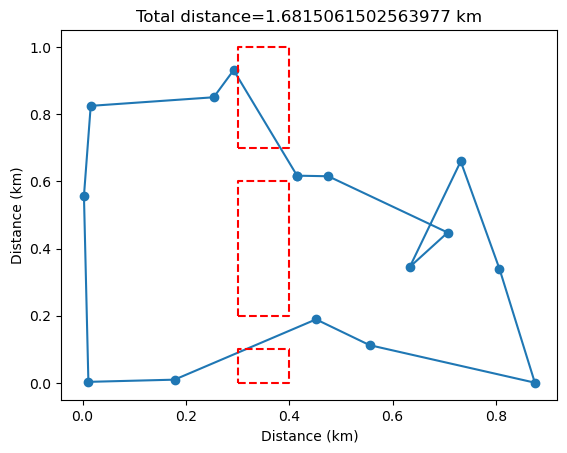

T=   0.10629 , distance=    1.68151 , accepted steps= 70


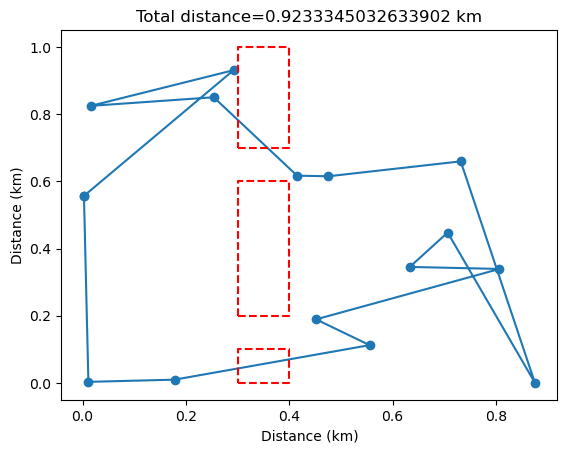

T=   0.09566 , distance=    0.92333 , accepted steps= 83


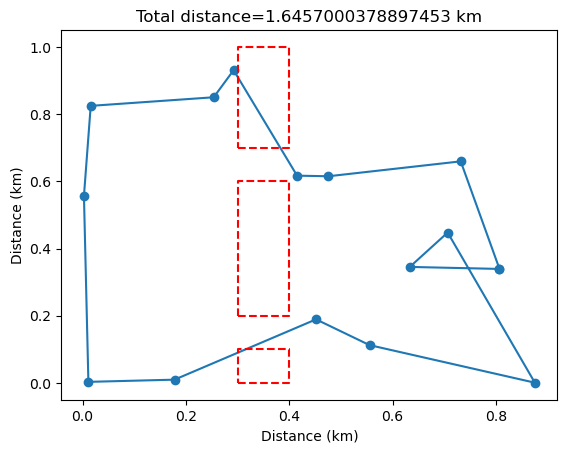

T=   0.08609 , distance=    1.64570 , accepted steps= 46


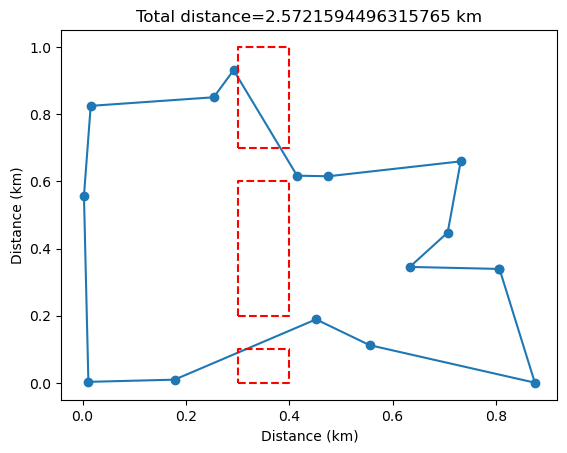

T=   0.07748 , distance=    2.57216 , accepted steps= 45


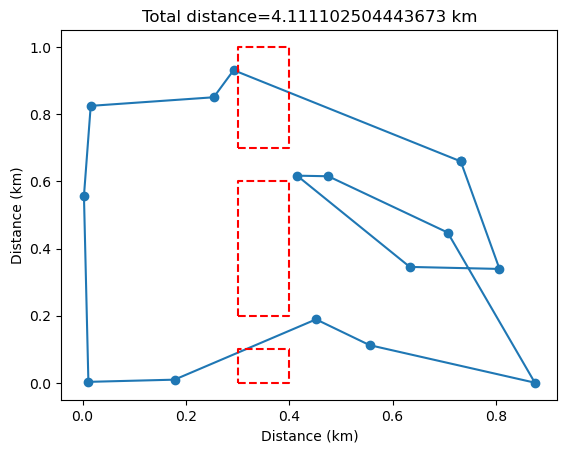

T=   0.06974 , distance=    4.11110 , accepted steps= 32


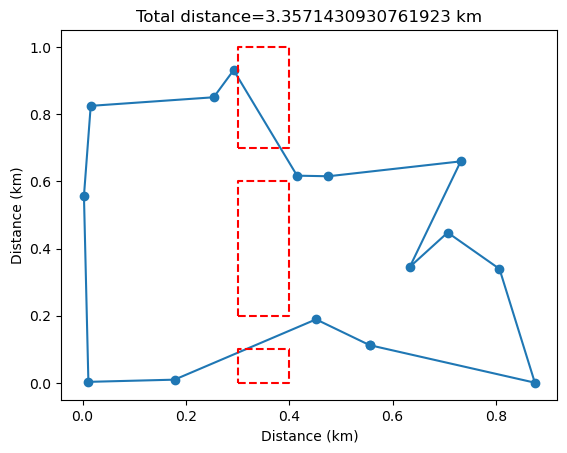

T=   0.06276 , distance=    3.35714 , accepted steps= 46


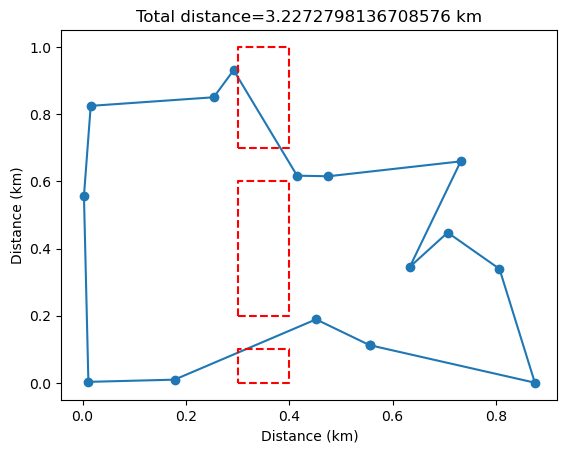

T=   0.05649 , distance=    3.22728 , accepted steps= 30


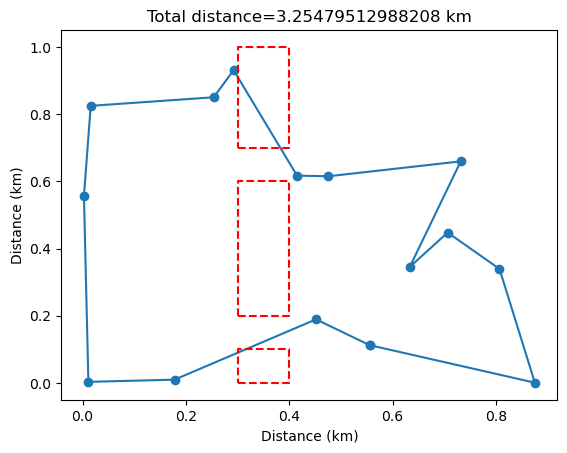

T=   0.05084 , distance=    3.25480 , accepted steps= 17


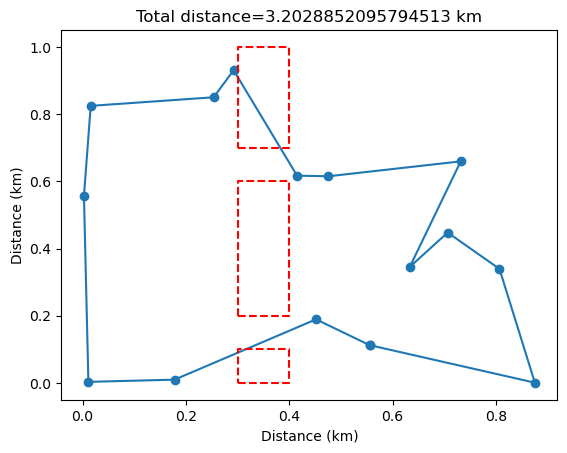

T=   0.04575 , distance=    3.20289 , accepted steps= 19


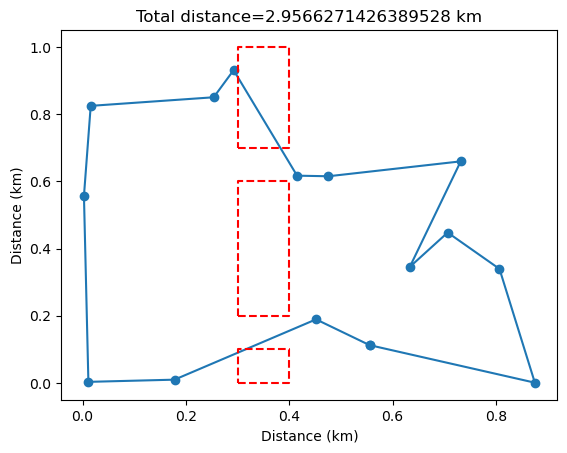

T=   0.04118 , distance=    2.95663 , accepted steps= 16


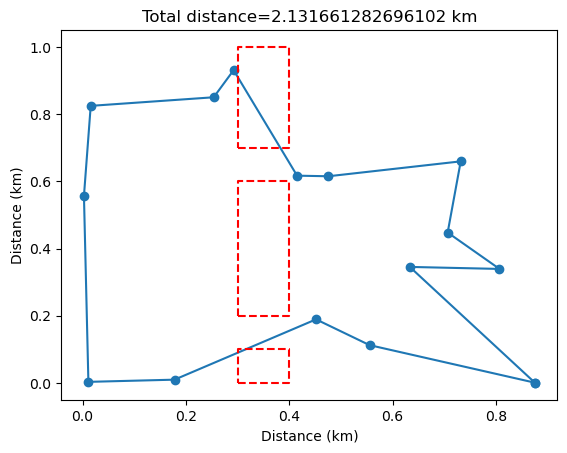

T=   0.03706 , distance=    2.13166 , accepted steps= 22


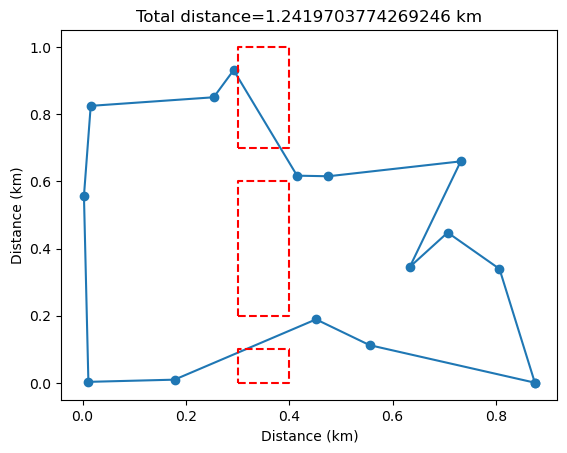

T=   0.03335 , distance=    1.24197 , accepted steps= 18


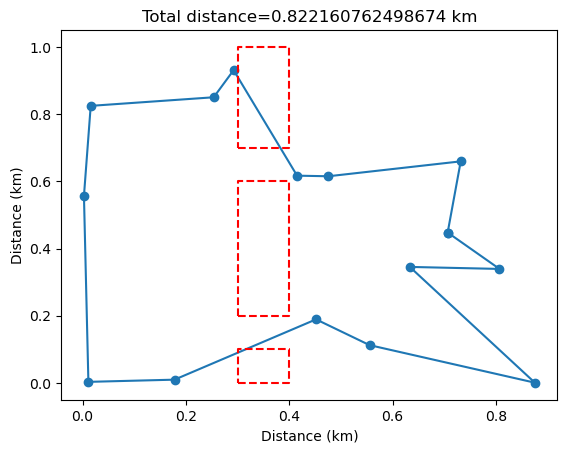

T=   0.03002 , distance=    0.82216 , accepted steps= 18


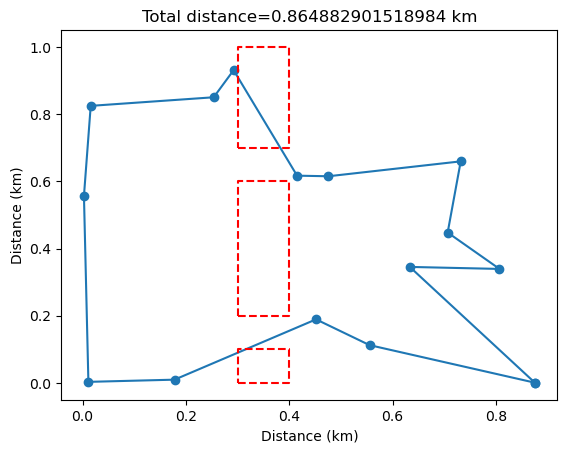

T=   0.02702 , distance=    0.86488 , accepted steps= 16


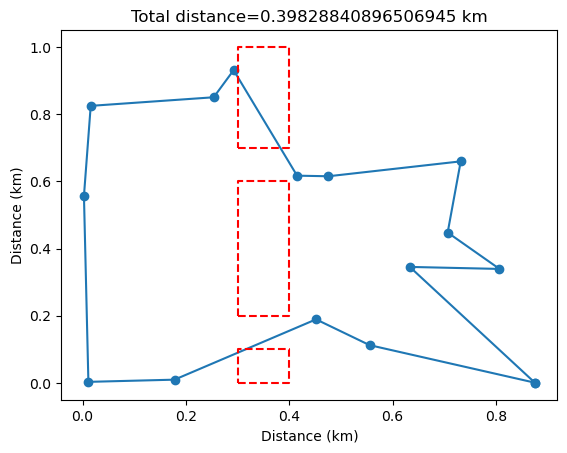

T=   0.02432 , distance=    0.39829 , accepted steps= 11


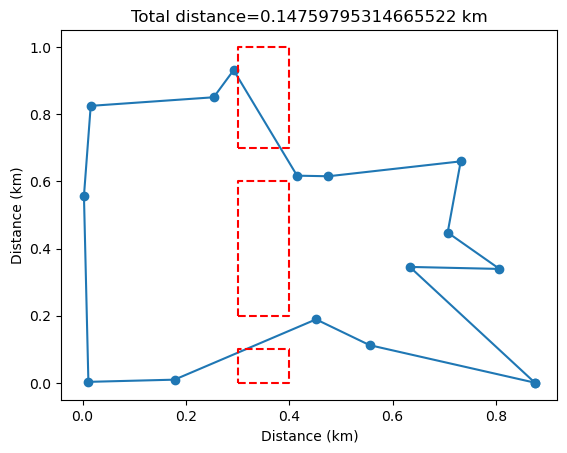

T=   0.02188 , distance=    0.14760 , accepted steps= 19


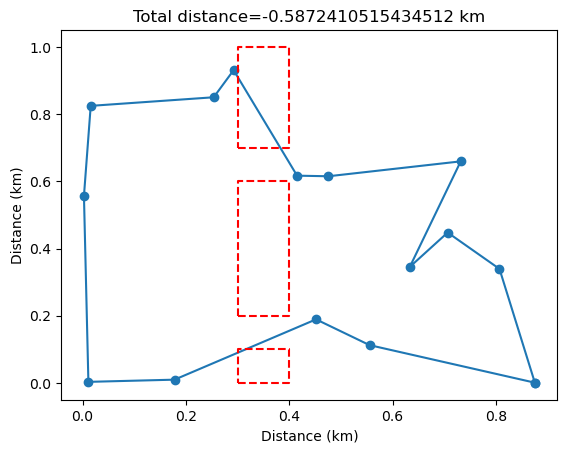

T=   0.01970 , distance=   -0.58724 , accepted steps= 15


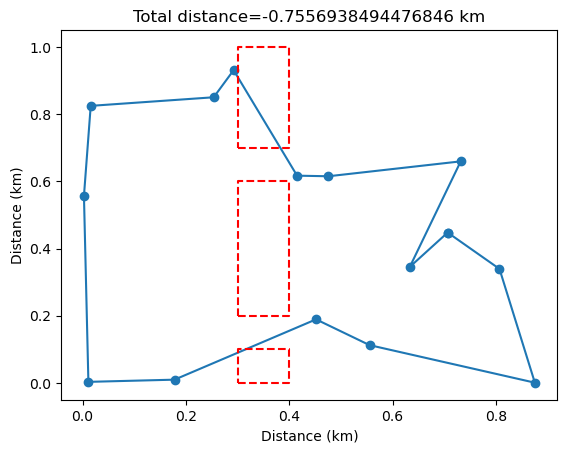

T=   0.01773 , distance=   -0.75569 , accepted steps= 10


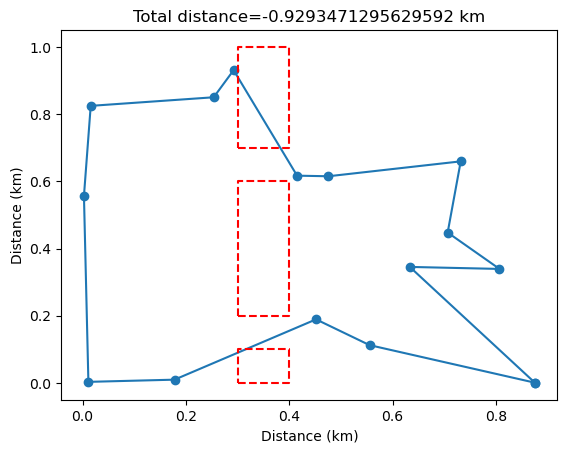

T=   0.01595 , distance=   -0.92935 , accepted steps= 9


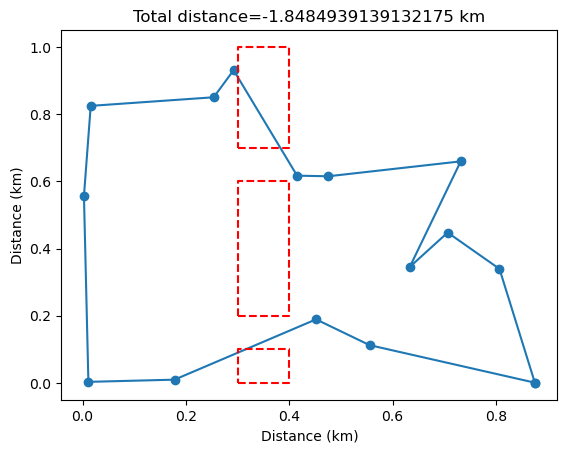

T=   0.01436 , distance=   -1.84849 , accepted steps= 20


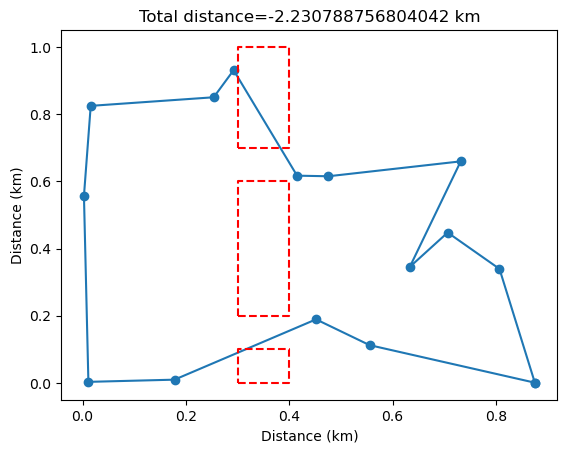

T=   0.01292 , distance=   -2.23079 , accepted steps= 12


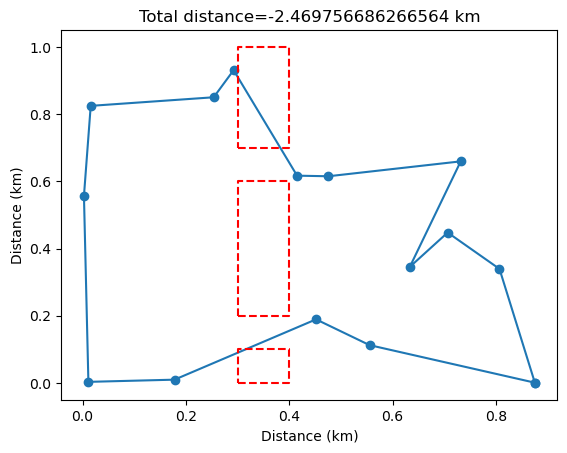

T=   0.01163 , distance=   -2.46976 , accepted steps= 14


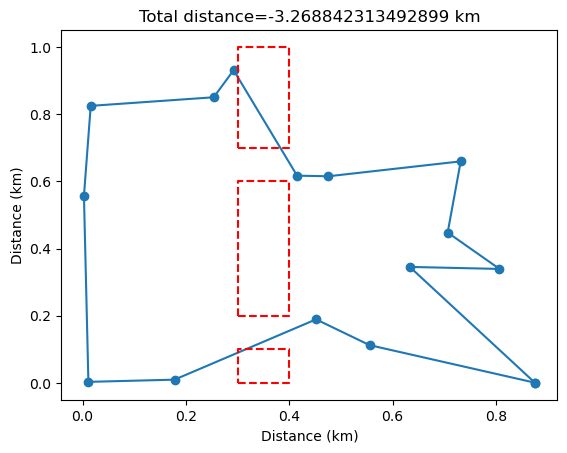

T=   0.01047 , distance=   -3.26884 , accepted steps= 19


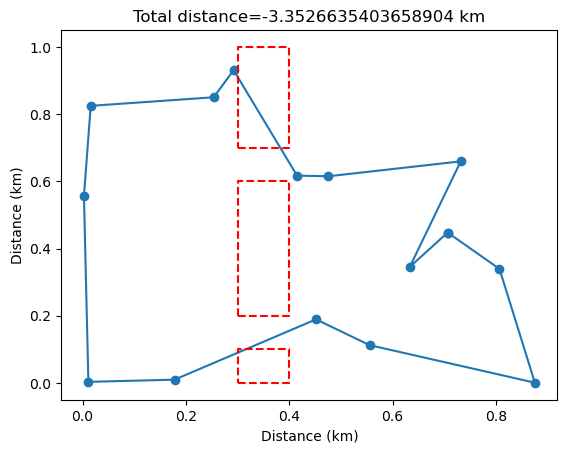

T=   0.00942 , distance=   -3.35266 , accepted steps= 8


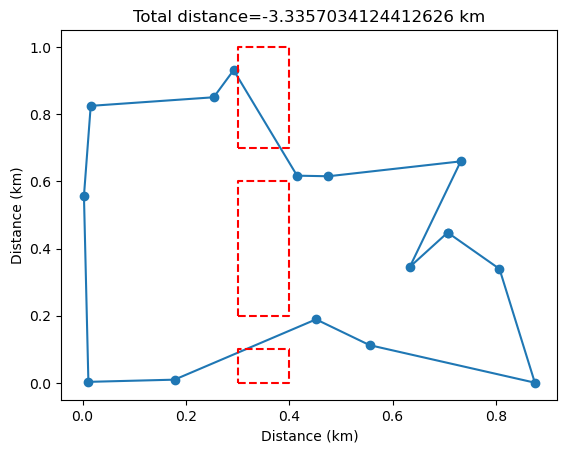

T=   0.00848 , distance=   -3.33570 , accepted steps= 5


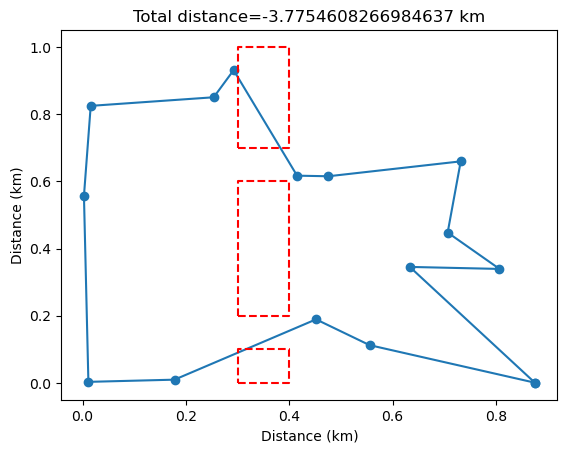

T=   0.00763 , distance=   -3.77546 , accepted steps= 13


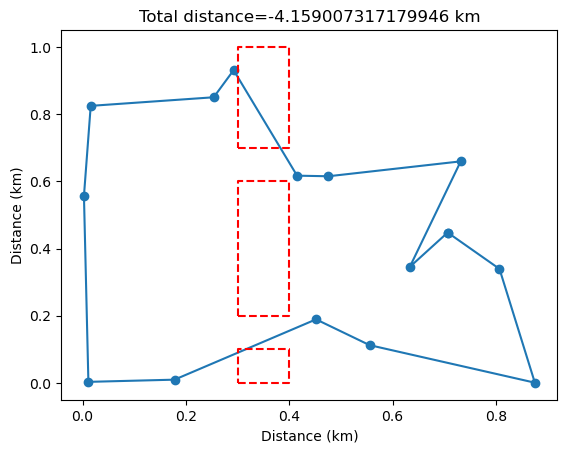

T=   0.00687 , distance=   -4.15901 , accepted steps= 11


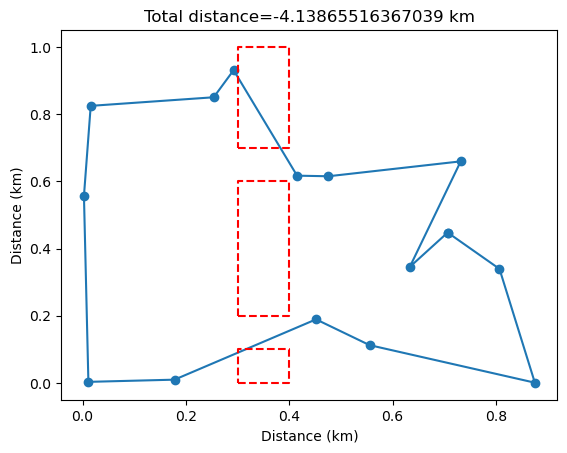

T=   0.00618 , distance=   -4.13866 , accepted steps= 6


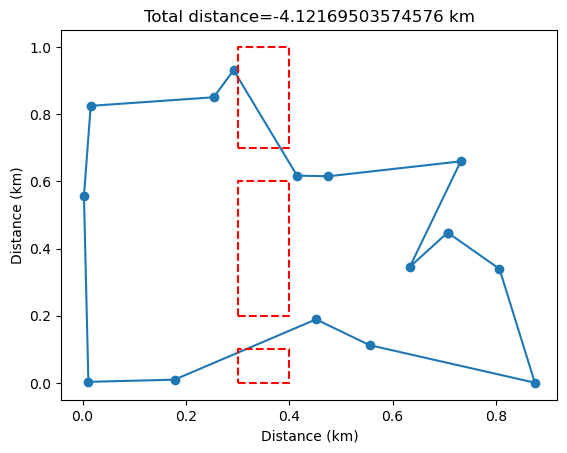

T=   0.00556 , distance=   -4.12170 , accepted steps= 5


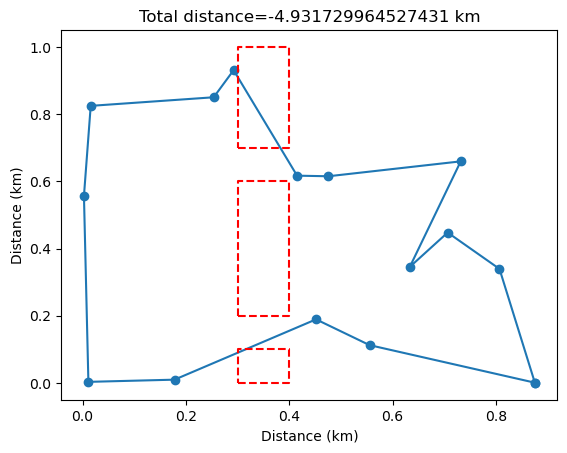

T=   0.00501 , distance=   -4.93173 , accepted steps= 19


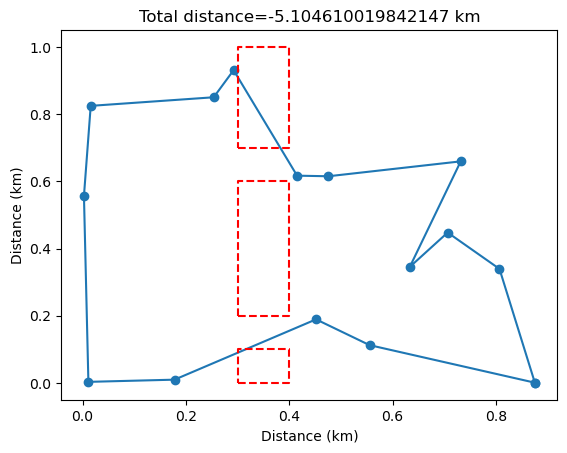

T=   0.00451 , distance=   -5.10461 , accepted steps= 6


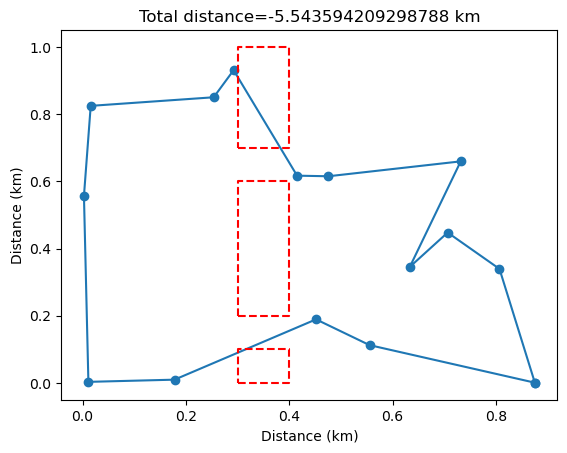

T=   0.00406 , distance=   -5.54359 , accepted steps= 8


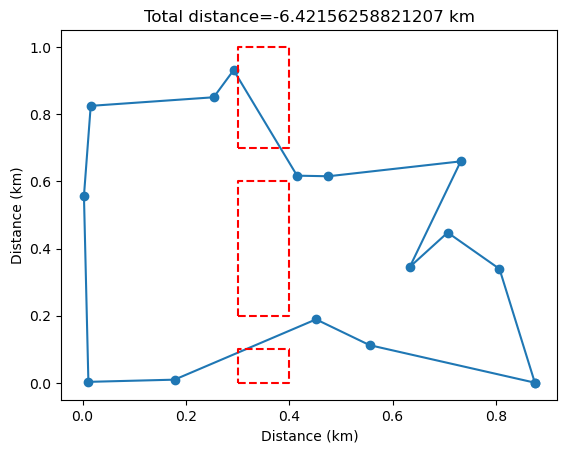

T=   0.00365 , distance=   -6.42156 , accepted steps= 16


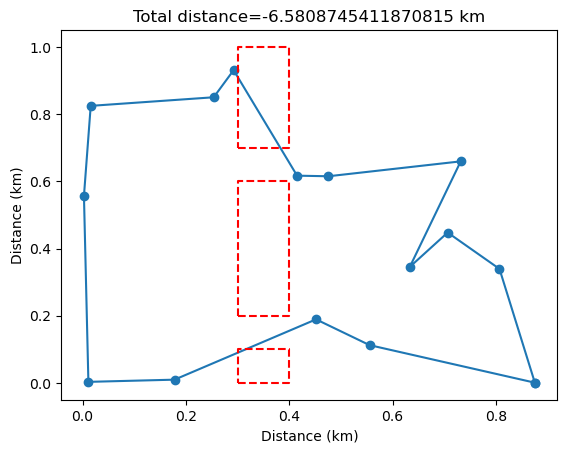

T=   0.00328 , distance=   -6.58087 , accepted steps= 8


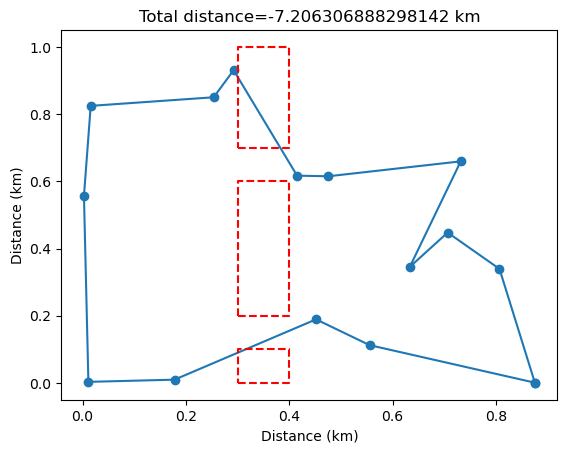

T=   0.00296 , distance=   -7.20631 , accepted steps= 8


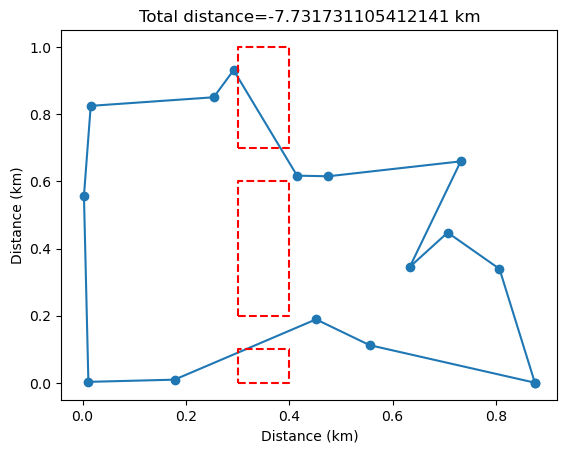

T=   0.00266 , distance=   -7.73173 , accepted steps= 10


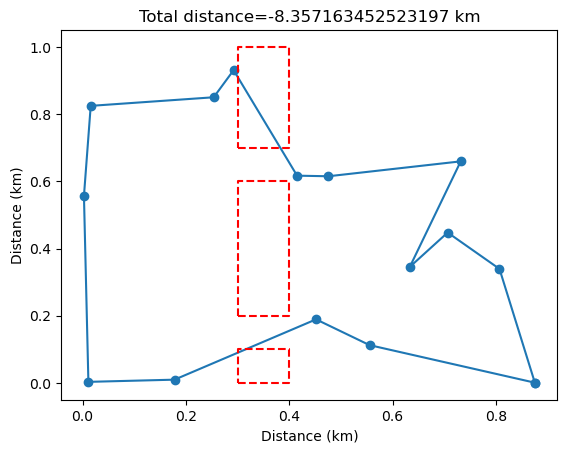

T=   0.00239 , distance=   -8.35716 , accepted steps= 8


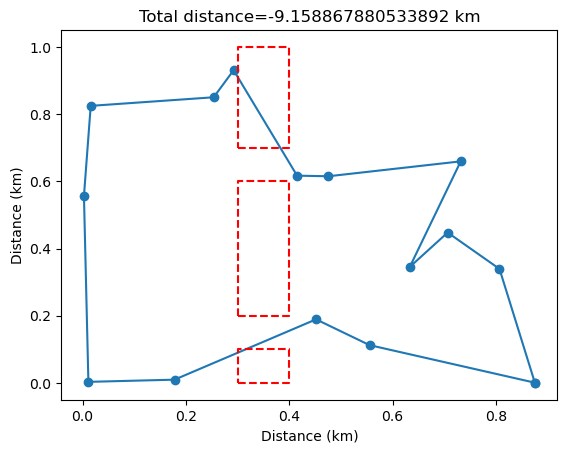

T=   0.00216 , distance=   -9.15887 , accepted steps= 11


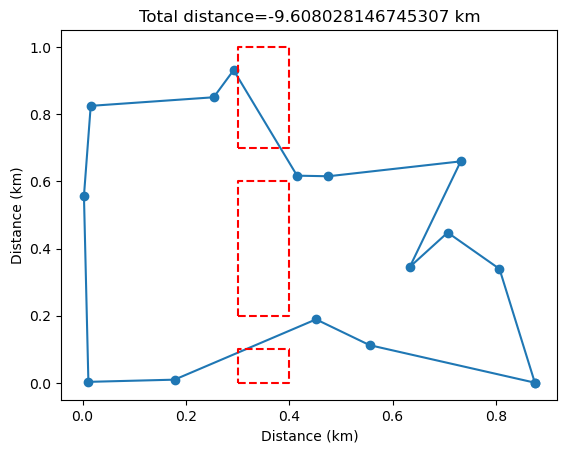

T=   0.00194 , distance=   -9.60803 , accepted steps= 5


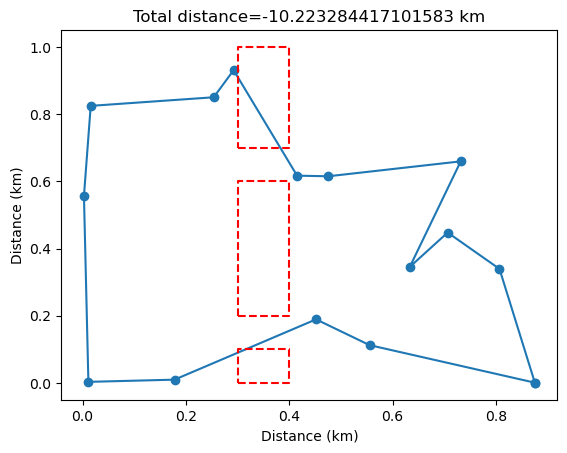

T=   0.00175 , distance=  -10.22328 , accepted steps= 11


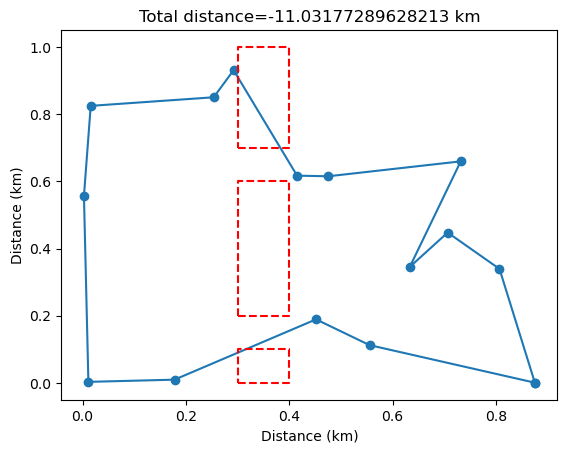

T=   0.00157 , distance=  -11.03177 , accepted steps= 9


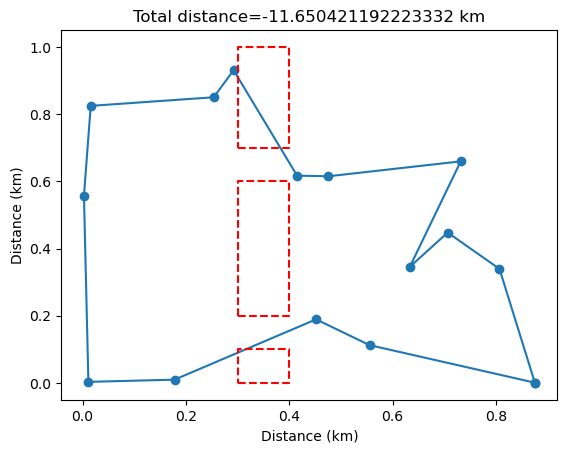

T=   0.00141 , distance=  -11.65042 , accepted steps= 10


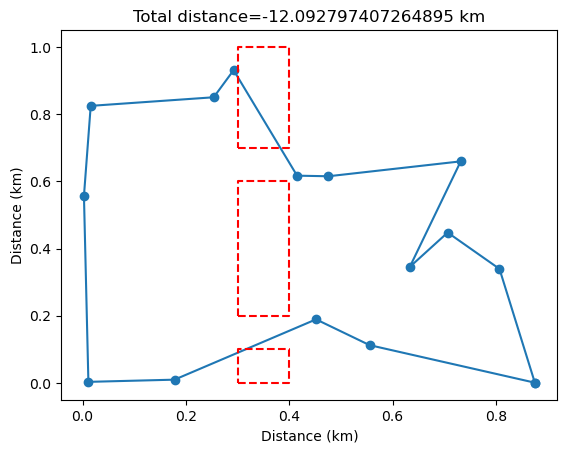

T=   0.00127 , distance=  -12.09280 , accepted steps= 7


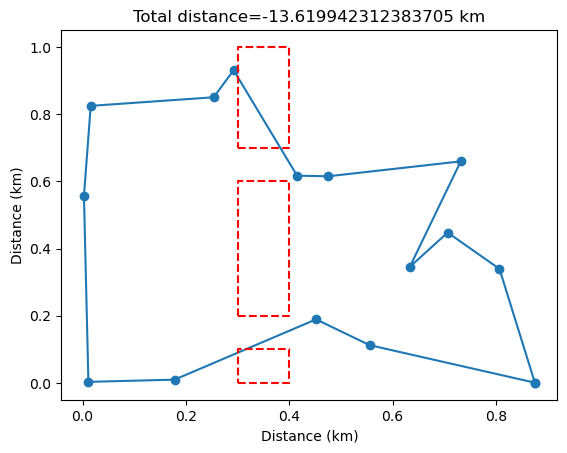

T=   0.00115 , distance=  -13.61994 , accepted steps= 17


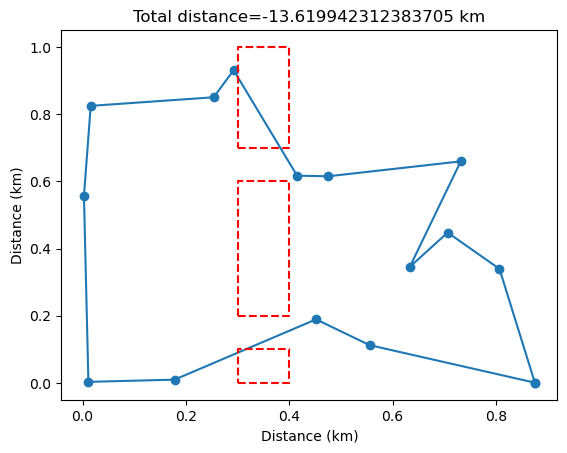

runTime:  42.714163303375244


<Figure size 640x480 with 0 Axes>

In [172]:
import time
from scipy import *
from pylab import *

start_time = time.time()

def Distance(R1, R2):
    return sqrt((R1[0] - R2[0]) ** 2 + (R1[1] - R2[1]) ** 2)

def TotalDistance(city, R):
    dist = 0
    for i in range(len(city) - 1):
        dist += Distance(R[city[i]], R[city[i + 1]])
    dist += Distance(R[city[-1]], R[city[0]])
    return dist

def CalculateObstaclePenalty(city, R, obstacles):
    obstacle_penalty = 0
    for i in range(len(city) - 1):
        for obstacle in obstacles:
            if LineIntersectsObstacle(R[city[i]], R[city[i + 1]], obstacle):
                obstacle_penalty += 1  # Increment obstacle penalty for each intersection
    return obstacle_penalty

def LineIntersectsObstacle(point1, point2, obstacle):
    x1, y1 = point1
    x2, y2 = point2
    x_min, y_min, x_max, y_max = obstacle
    # Check if the line segment intersects with the rectangle defined by obstacle
    return (
        (x_min <= x1 <= x_max or x_min <= x2 <= x_max) and
        (y_min <= y1 <= y_max or y_min <= y2 <= y_max) and
        (x1 - x2) * (y_min - y_max) != (x_min - x_max) * (y1 - y2)  # Check for intersection
    )

def IsCityInsideObstacles(new_city, obstacles):
    for obstacle in obstacles:
        x_min, y_min, x_max, y_max = obstacle
        if x_min <= new_city[0] <= x_max and y_min <= new_city[1] <= y_max:
            return True
    return False

def IsPathThroughObstacles(city, R, obstacles):
    for i in range(len(city) - 1):
        for obstacle in obstacles:
            if LineIntersectsObstacle(R[city[i]], R[city[i + 1]], obstacle):
                return True
    return False

def reverse(city, n):
    nct = len(city)
    nn = (1 + ((n[1] - n[0]) % nct)) / 2  
    inty = int(nn)
    for j in range(inty):
        k = (n[0] + j) % nct
        l = (n[1] - j) % nct
        city[k], city[l] = city[k], city[l]

def transpt(city, n):
    nct = len(city)
    newcity = []
    for j in range((n[1] - n[0]) % nct + 1):
        newcity.append(city[(j + n[0]) % nct])
    for j in range((n[2] - n[5]) % nct + 1):
        newcity.append(city[(j + n[5]) % nct])
    for j in range((n[4] - n[3]) % nct + 1):
        newcity.append(city[(j + n[3]) % nct])
    return newcity

COUNT = 0

def Plot(city, R, dist, obstacles):
    global COUNT
    Pt = [R[city[i]] for i in range(len(city))]
    Pt += [R[city[0]]]
    Pt = array(Pt)
    title('Total distance=' + str(dist) + ' km')
    plot(Pt[:, 0], Pt[:, 1], '-o')
    for obstacle in obstacles:
        x_min, y_min, x_max, y_max = obstacle
        plt.plot([x_min, x_max, x_max, x_min, x_min], [y_min, y_min, y_max, y_max, y_min], 'r--')
    fig1 = gcf()
    plt.xlabel('Distance (km)')
    plt.ylabel('Distance (km)')
    plt.show()  # Display the plot before saving
    fig1.savefig('annealStep' + str(COUNT) + '.png')
    plt.clf()  # Clear the current figure after saving
    COUNT += 1

if __name__ == '__main__':
    ncity = 15  # Number of cities to visit
    maxTsteps = 50  # Temperature is lowered not more than maxTsteps
    Tstart = 0.2  # Starting temperature
    fCool = 0.9  # Factor to multiply temperature at each cooling step
    Preverse = 0.5  # Probability for reverse/transpose trial move
    convergence_threshold = 10  # Number of iterations with no change to consider convergence
    obstacle_penalty_factor = 100  # Factor to increase energy for paths crossing obstacles

    # Choosing city coordinates
    R = []  # Coordinates of cities are chosen randomly
    for i in range(ncity):
        while True:
            new_city = [rand(), rand()]
            if not IsCityInsideObstacles(new_city, obstacles) and not IsPathThroughObstacles([new_city], R, obstacles):
                R.append(new_city)
                break
    R = array(R)

    # Define your own obstacles as rectangles [x_min, y_min, x_max, y_max]
    my_obstacles = [
        [0.3, 0, 0.4, 0.1],  # Example obstacle 1
        [0.3, 0.2, 0.4, 0.6],   # Example obstacle 2
        [0.3, 0.7, 0.4, 1]
    ]

    # Pass your obstacles to the obstacles variable
    obstacles = my_obstacles

    # The index table -- the order the cities are visited.
    ncity = len(R)
    maxSteps = 100 * ncity  # Number of steps at constant temperature
    maxAccepted = 10 * ncity  # Number of accepted steps at constant temperature

    city = list(range(ncity))

    # Distance of the travel at the beginning
    dist = TotalDistance(city, R)
    dist = round(dist, 5)

    # Stores points of a move
    n = zeros(6, dtype=int)
    nct = len(R)  # Number of cities

    T = Tstart  # Temperature

    Plot(city, R, dist, obstacles)

    # Track previous distance to check for convergence
    prev_dist = dist
    unchanged_count = 0  # Counter for consecutive iterations with no change

    for t in range(maxTsteps):  # Over temperature
        accepted = 0
        for i in range(maxSteps):  # At each temperature, many Monte Carlo steps
            while True:  # Will find two random cities sufficiently close by
                n[0] = int((nct) * rand())  # Select one city
                n[1] = int((nct - 1) * rand())  # Select another city, but not the same
                if n[1] >= n[0]:
                    n[1] += 1
                if n[1] < n[0]:
                    n[0], n[1] = n[1], n[0]  # Swap, because it must be: n[0]<n[1]
                nn = (n[0] + nct - n[1] - 1) % nct  # Number of cities not on the segment n[0]..n[1]
                if nn >= 3:
                    break

            n[2] = (n[0] - 1) % nct  # Index before n0
            n[3] = (n[1] + 1) % nct  # Index after n2

            if Preverse > rand():
                # Reverse a segment
                de = Distance(R[city[n[2]]], R[city[n[1]]]) + Distance(R[city[n[3]]], R[city[n[0]]]) - Distance(
                    R[city[n[2]]], R[city[n[0]]]) - Distance(R[city[n[3]]], R[city[n[1]]])

                # Calculate obstacle penalty
                obstacle_penalty = CalculateObstaclePenalty(city, R, obstacles)
                de += obstacle_penalty * obstacle_penalty_factor  # Add obstacle penalty to the change in distance

                # Metropolis acceptance criterion with obstacle penalty
                if de < 0 or exp(-de / T) > rand():  # Metropolis
                    accepted += 1
                    dist += de
                    reverse(city, n)
            else:
                # Transpose a segment
                nc = (n[1] + 1 + int(rand() * (nn - 1))) % nct  
                n[4] = nc
                n[5] = (nc + 1) % nct

                de = -Distance(R[city[n[1]]], R[city[n[3]]]) - Distance(R[city[n[0]]], R[city[n[2]]]) - Distance(
                    R[city[n[4]]], R[city[n[5]]])
                de += Distance(R[city[n[0]]], R[city[n[4]]]) + Distance(R[city[n[1]]], R[city[n[5]]]) + Distance(
                    R[city[n[2]]], R[city[n[3]]])

                # Calculate obstacle penalty
                obstacle_penalty = CalculateObstaclePenalty(city, R, obstacles)
                de += obstacle_penalty * obstacle_penalty_factor  # Add obstacle penalty to the change in distance

                # Metropolis acceptance criterion with obstacle penalty
                if de < 0 or exp(-de / T) > rand():  # Metropolis
                    accepted += 1
                    dist += de
                    city = transpt(city, n)

            if accepted > maxAccepted:
                break

        # Plot
        Plot(city, R, dist, obstacles)

        print("T=%10.5f , distance= %10.5f , accepted steps= %d" % (T, dist, accepted))

        # Check for convergence
        if dist == prev_dist:
            unchanged_count += 1
        else:
            unchanged_count = 0
        if unchanged_count >= convergence_threshold:  # If no change for 10 iterations, consider converged
            print("Converged after", t, "iterations.")
            break

        prev_dist = dist
        T *= fCool  # The system is cooled down

    Plot(city, R, dist, obstacles)

runTime = time.time() - start_time
print("runTime: ", runTime)


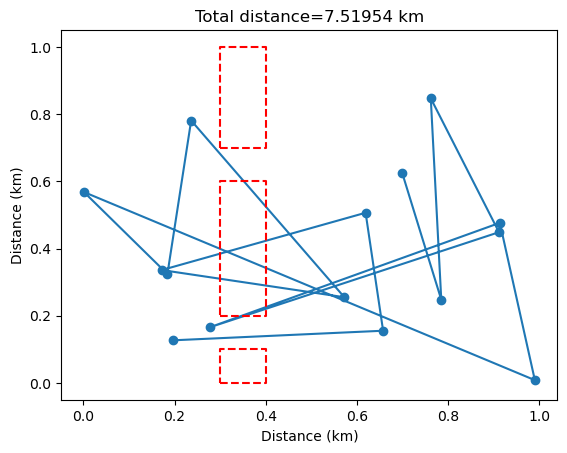

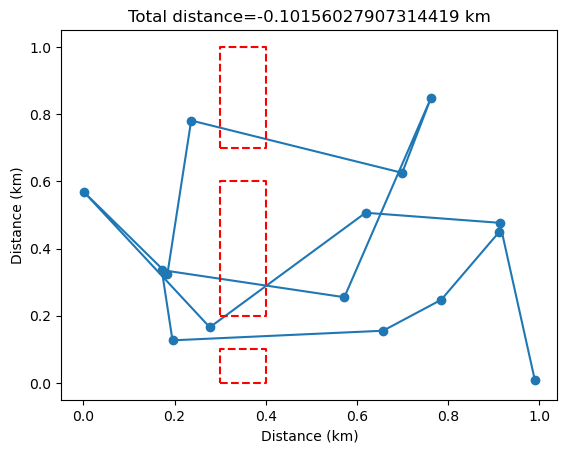

T=   0.20000 , distance=   -0.10156 , accepted steps= 151


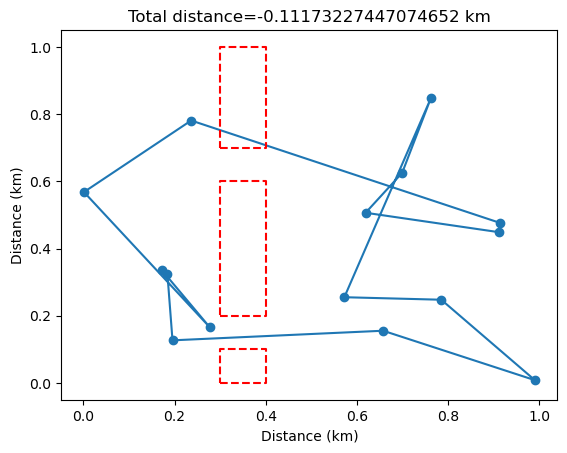

T=   0.18000 , distance=   -0.11173 , accepted steps= 151


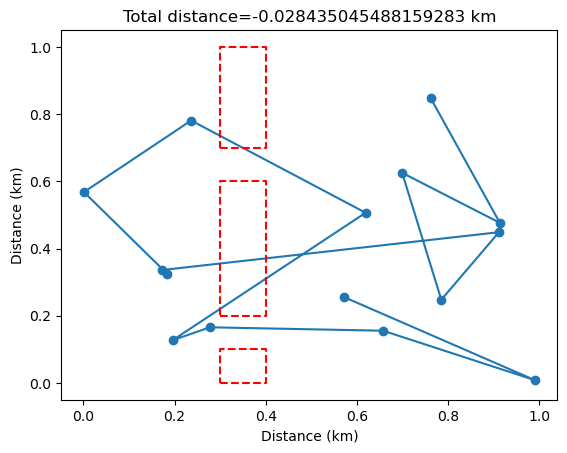

T=   0.16200 , distance=   -0.02844 , accepted steps= 151


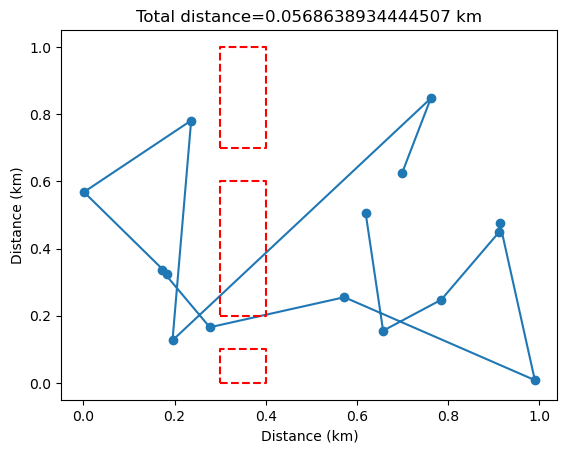

T=   0.14580 , distance=    0.05686 , accepted steps= 151


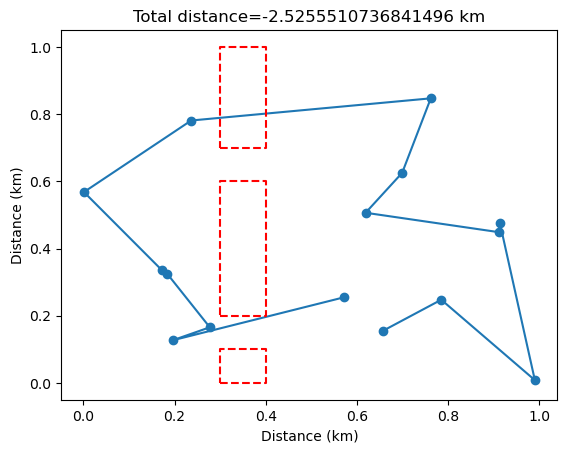

T=   0.13122 , distance=   -2.52555 , accepted steps= 151


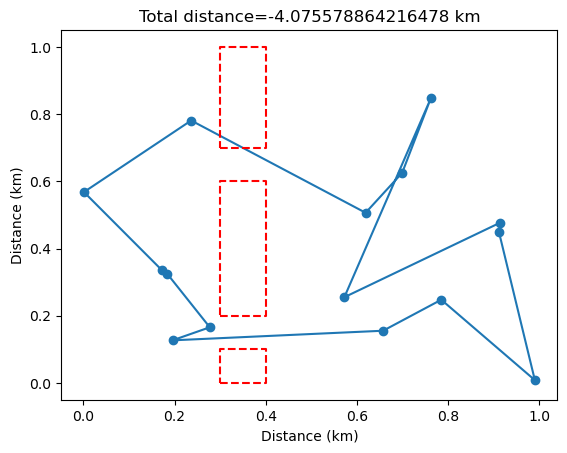

T=   0.11810 , distance=   -4.07558 , accepted steps= 149


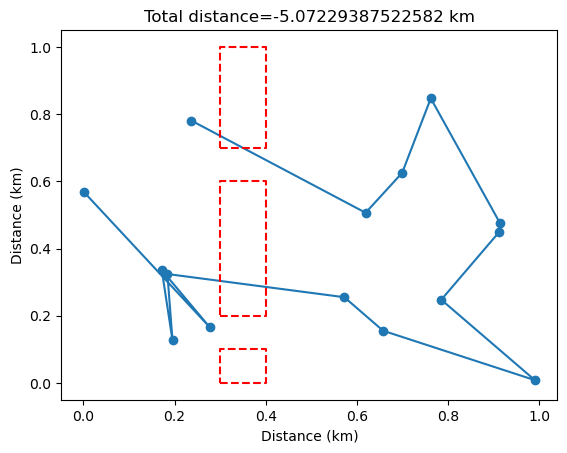

T=   0.10629 , distance=   -5.07229 , accepted steps= 79


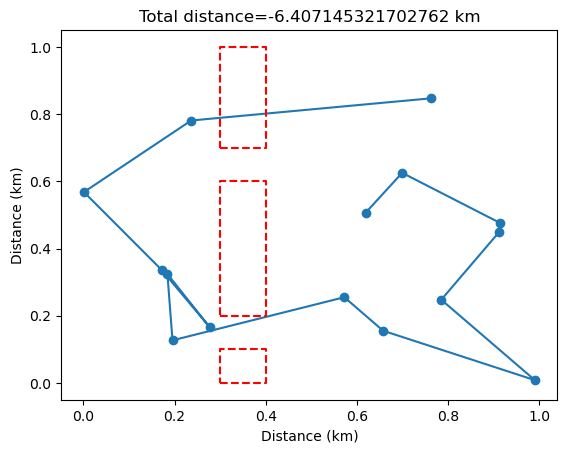

T=   0.09566 , distance=   -6.40715 , accepted steps= 70


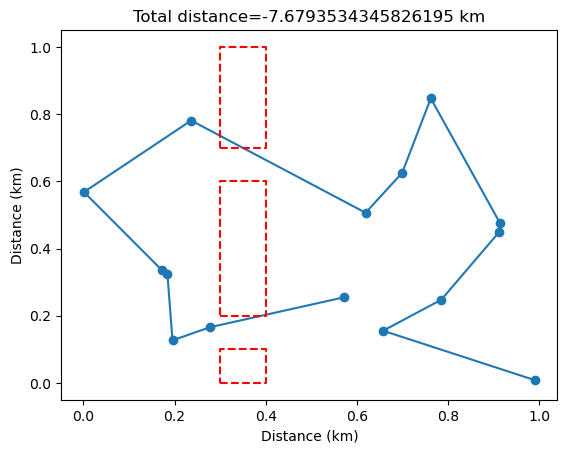

T=   0.08609 , distance=   -7.67935 , accepted steps= 80


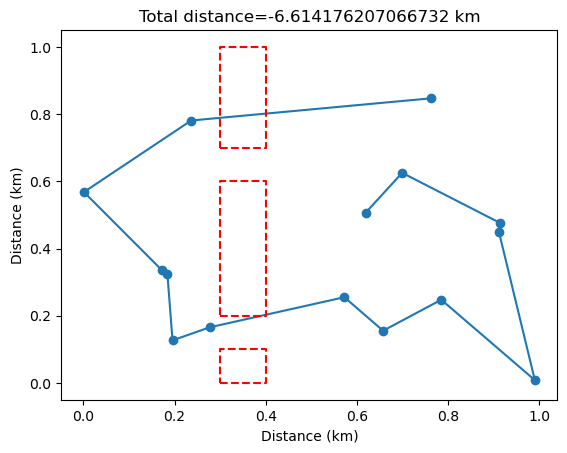

T=   0.07748 , distance=   -6.61418 , accepted steps= 63


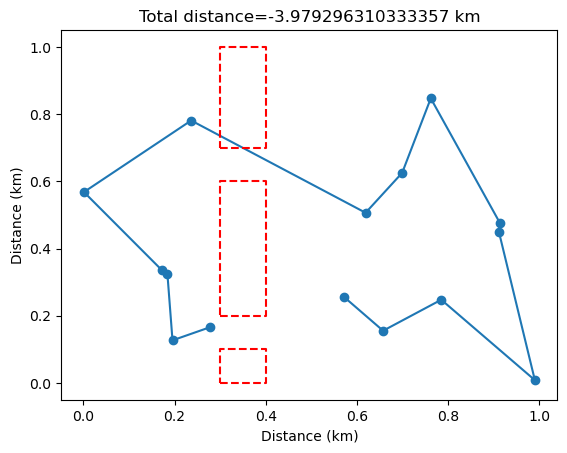

T=   0.06974 , distance=   -3.97930 , accepted steps= 58


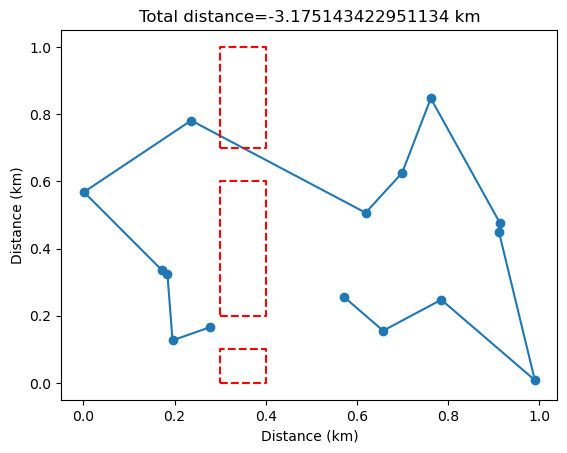

T=   0.06276 , distance=   -3.17514 , accepted steps= 41


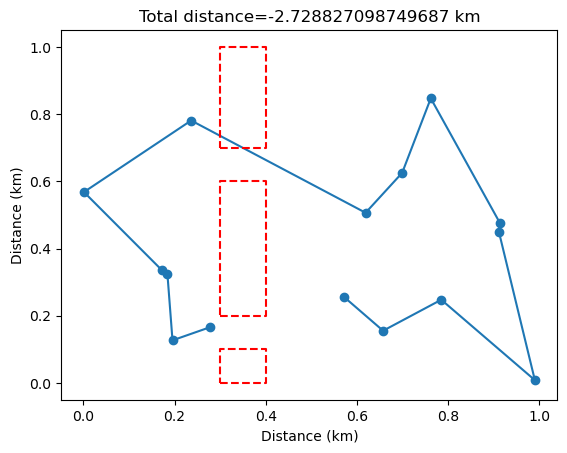

T=   0.05649 , distance=   -2.72883 , accepted steps= 34


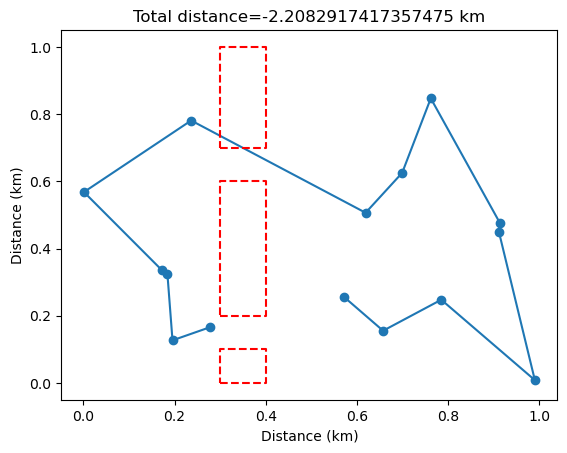

T=   0.05084 , distance=   -2.20829 , accepted steps= 27


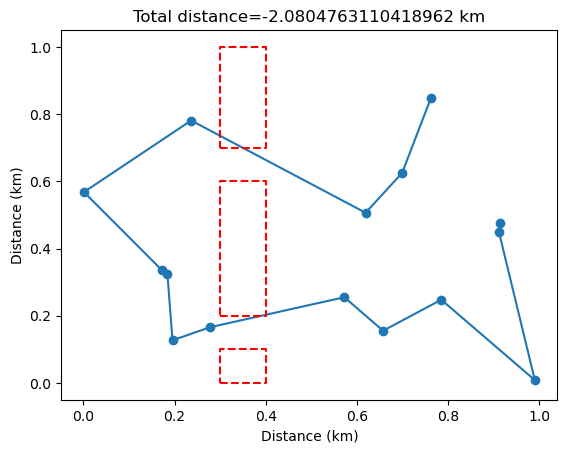

T=   0.04575 , distance=   -2.08048 , accepted steps= 29


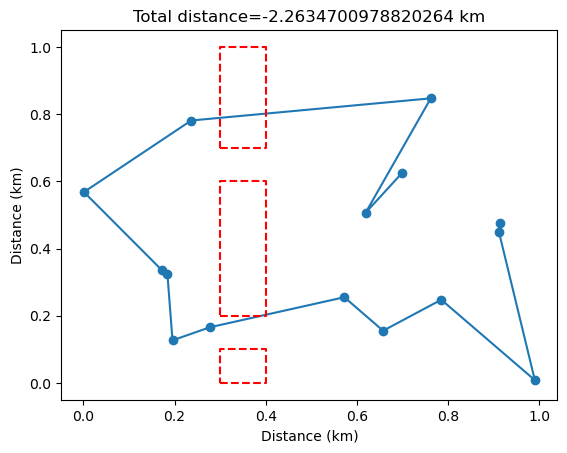

T=   0.04118 , distance=   -2.26347 , accepted steps= 25


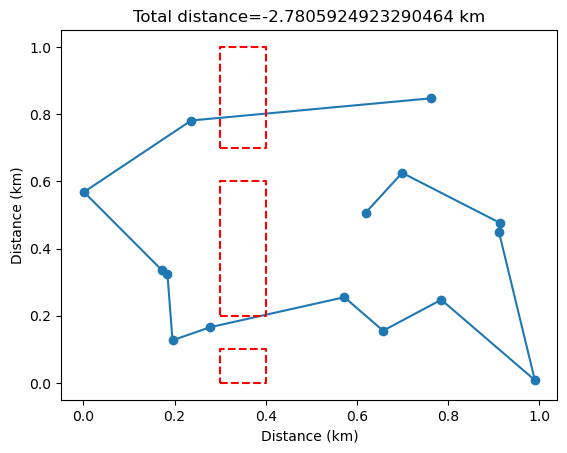

T=   0.03706 , distance=   -2.78059 , accepted steps= 29


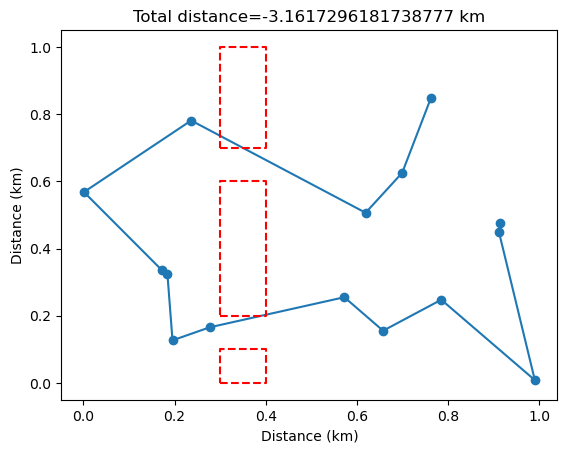

T=   0.03335 , distance=   -3.16173 , accepted steps= 28


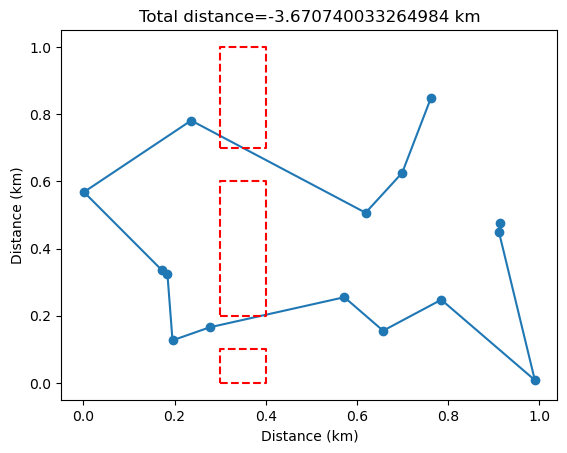

T=   0.03002 , distance=   -3.67074 , accepted steps= 34


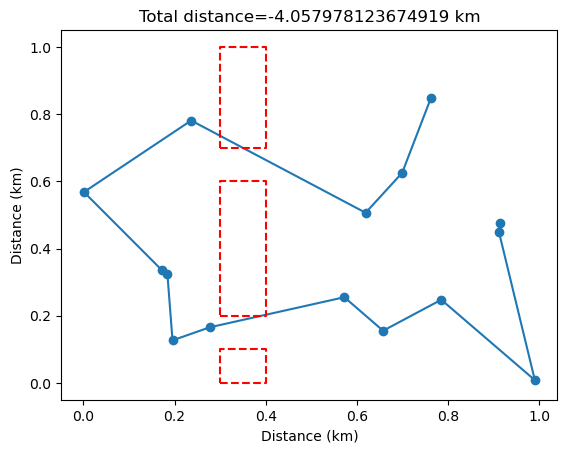

T=   0.02702 , distance=   -4.05798 , accepted steps= 26


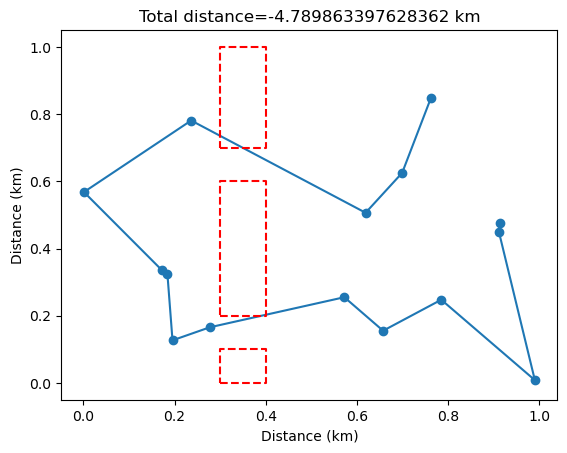

T=   0.02432 , distance=   -4.78986 , accepted steps= 31


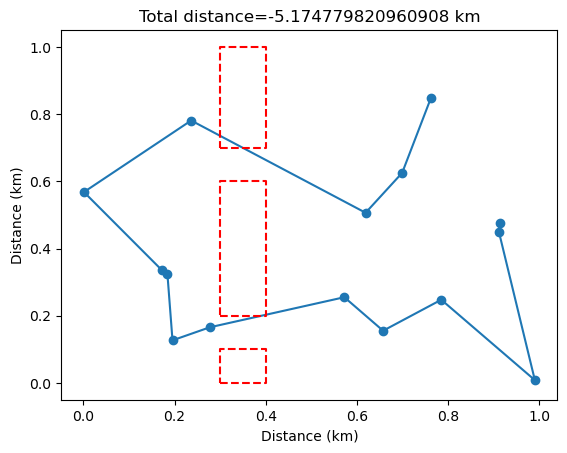

T=   0.02188 , distance=   -5.17478 , accepted steps= 16


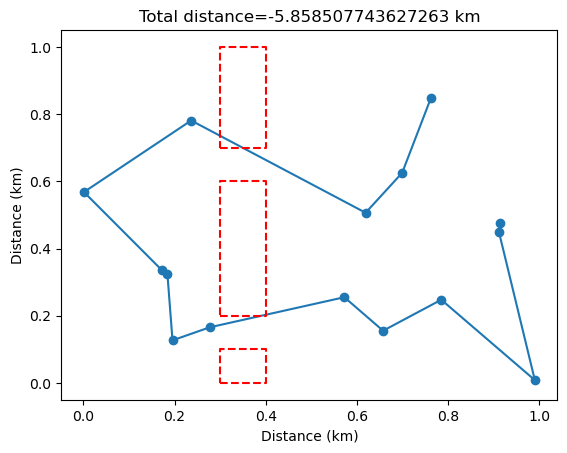

T=   0.01970 , distance=   -5.85851 , accepted steps= 23


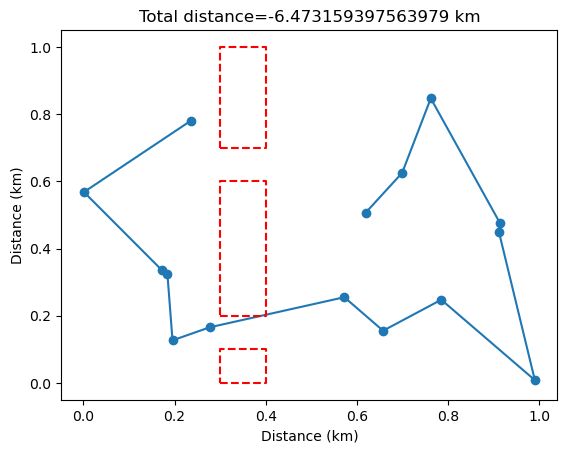

T=   0.01773 , distance=   -6.47316 , accepted steps= 28


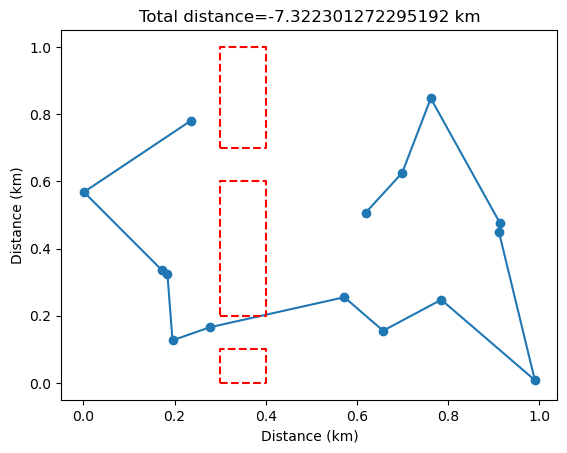

T=   0.01595 , distance=   -7.32230 , accepted steps= 25


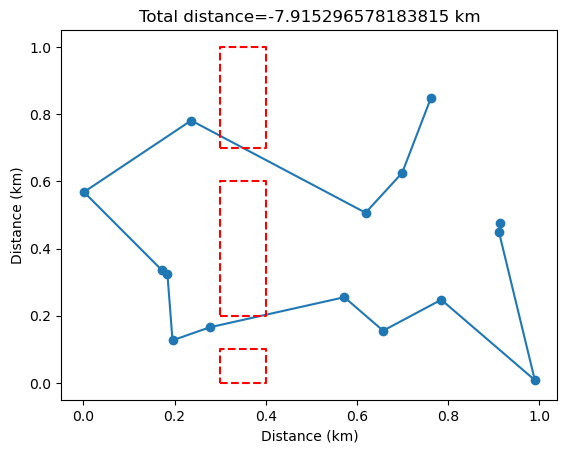

T=   0.01436 , distance=   -7.91530 , accepted steps= 26


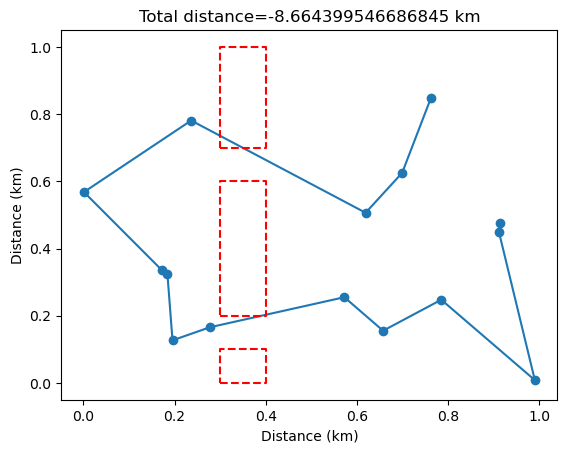

T=   0.01292 , distance=   -8.66440 , accepted steps= 23


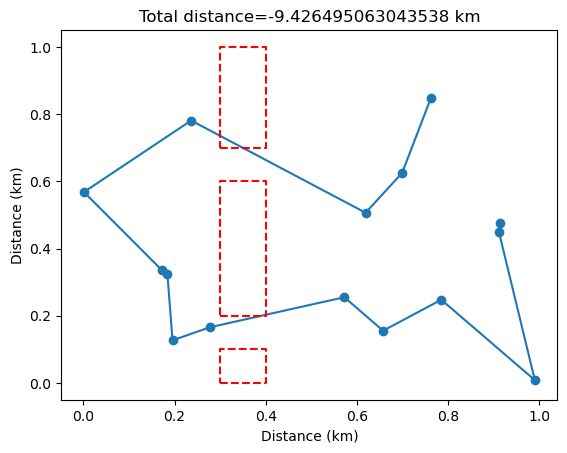

T=   0.01163 , distance=   -9.42650 , accepted steps= 27


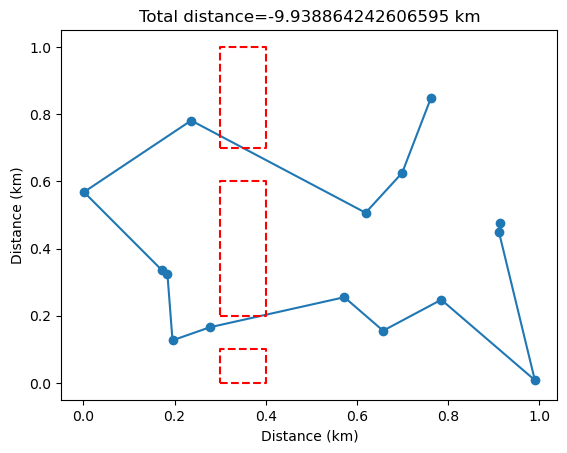

T=   0.01047 , distance=   -9.93886 , accepted steps= 15


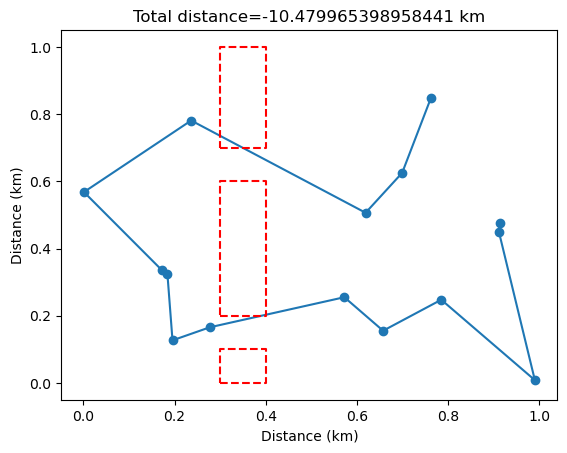

T=   0.00942 , distance=  -10.47997 , accepted steps= 21


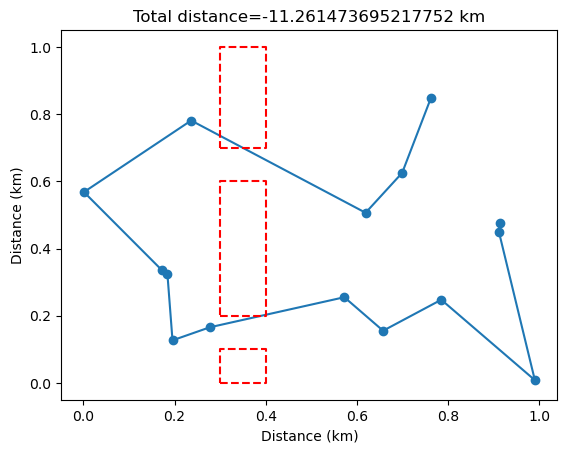

T=   0.00848 , distance=  -11.26147 , accepted steps= 20


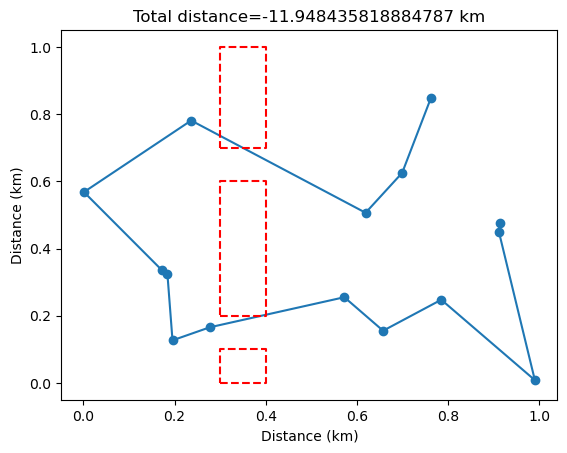

T=   0.00763 , distance=  -11.94844 , accepted steps= 21


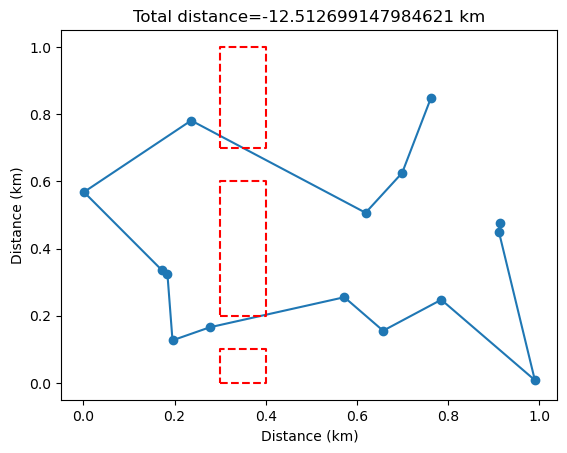

T=   0.00687 , distance=  -12.51270 , accepted steps= 18


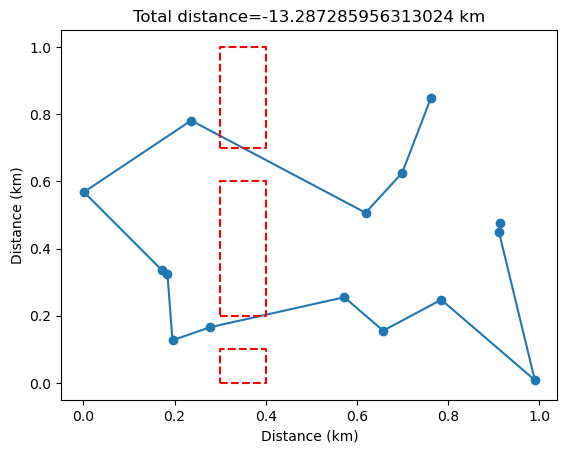

T=   0.00618 , distance=  -13.28729 , accepted steps= 28


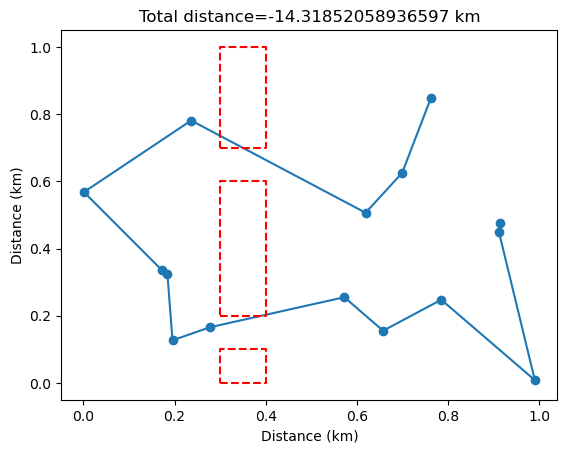

T=   0.00556 , distance=  -14.31852 , accepted steps= 32


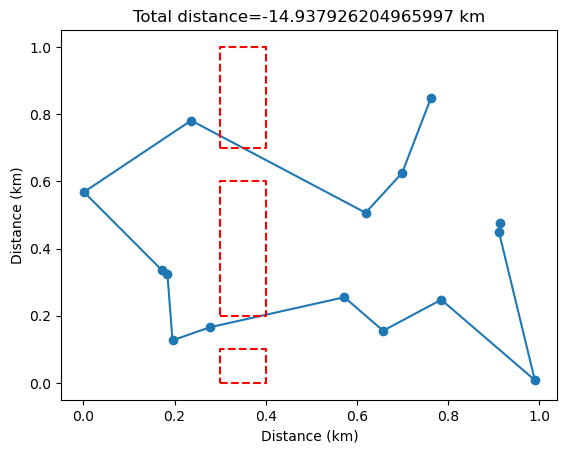

T=   0.00501 , distance=  -14.93793 , accepted steps= 22


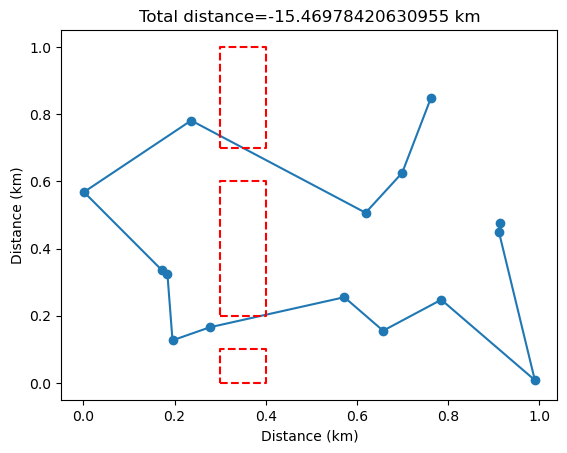

T=   0.00451 , distance=  -15.46978 , accepted steps= 21


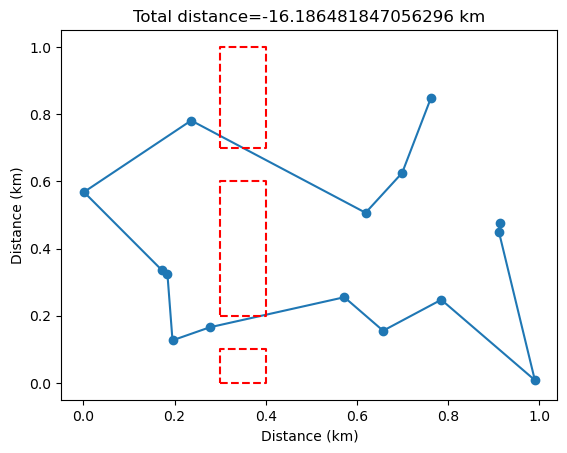

T=   0.00406 , distance=  -16.18648 , accepted steps= 26


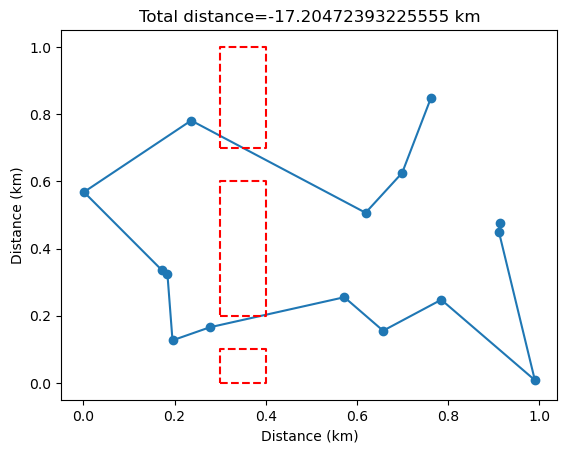

T=   0.00365 , distance=  -17.20472 , accepted steps= 28


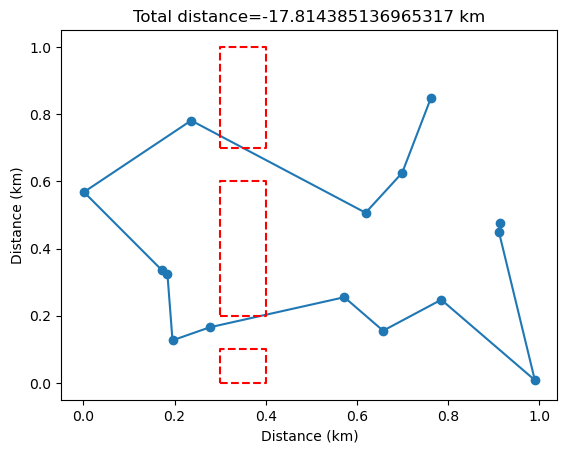

T=   0.00328 , distance=  -17.81439 , accepted steps= 19


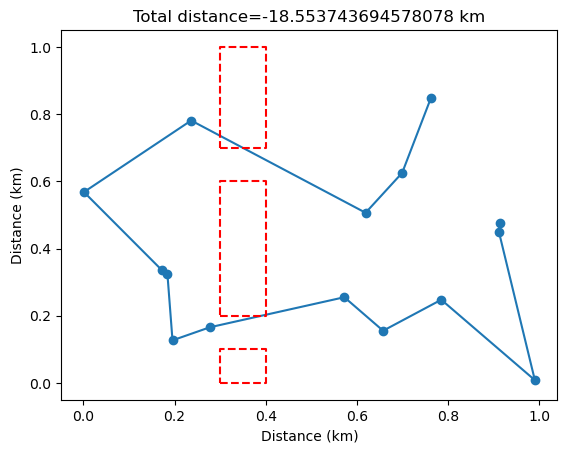

T=   0.00296 , distance=  -18.55374 , accepted steps= 20


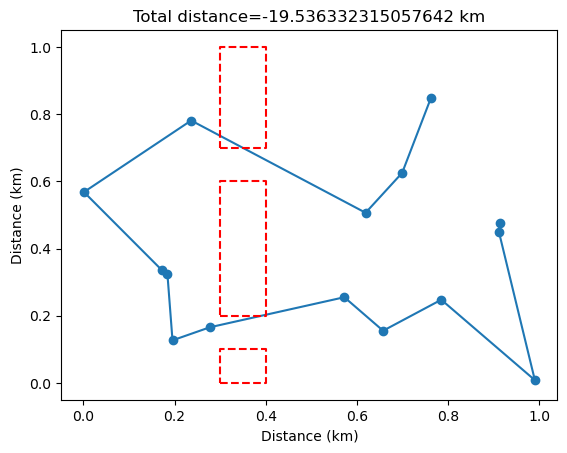

T=   0.00266 , distance=  -19.53633 , accepted steps= 30


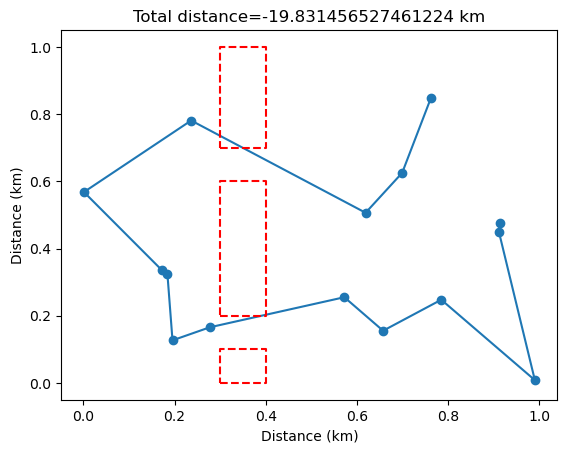

T=   0.00239 , distance=  -19.83146 , accepted steps= 13


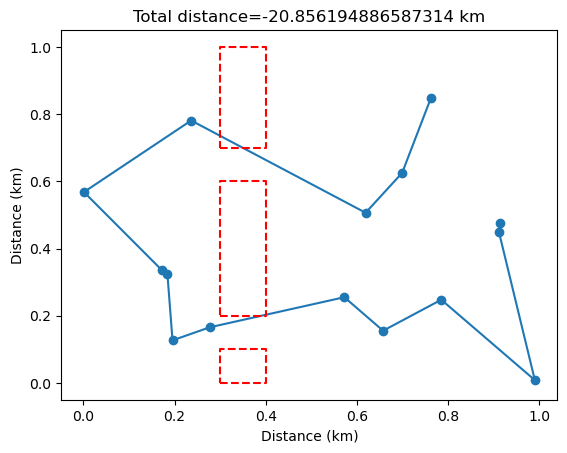

T=   0.00216 , distance=  -20.85619 , accepted steps= 30


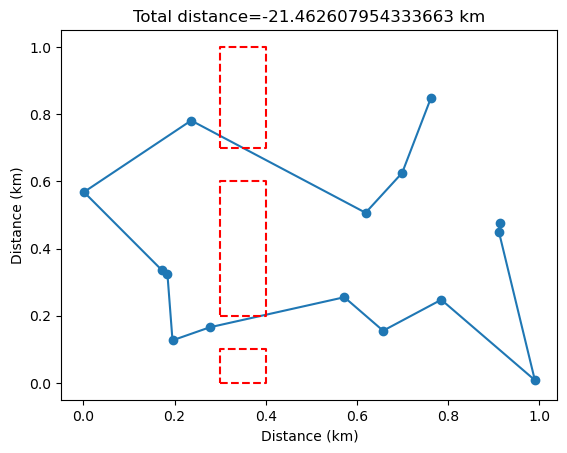

T=   0.00194 , distance=  -21.46261 , accepted steps= 18


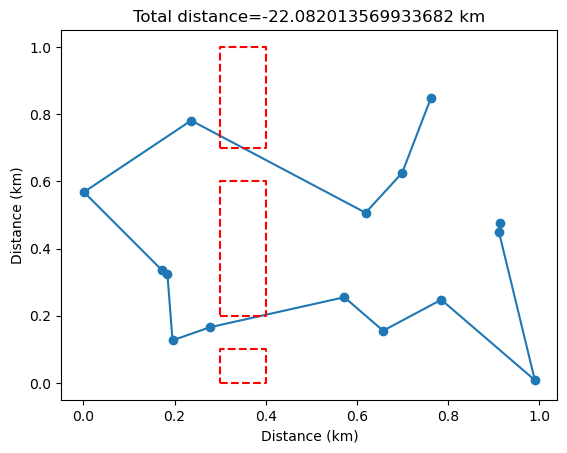

T=   0.00175 , distance=  -22.08201 , accepted steps= 22


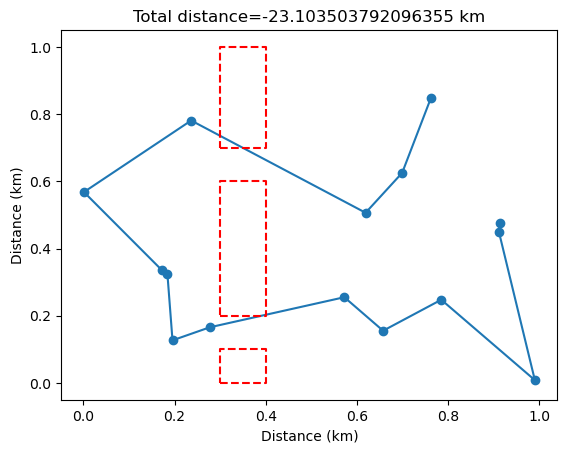

T=   0.00157 , distance=  -23.10350 , accepted steps= 29


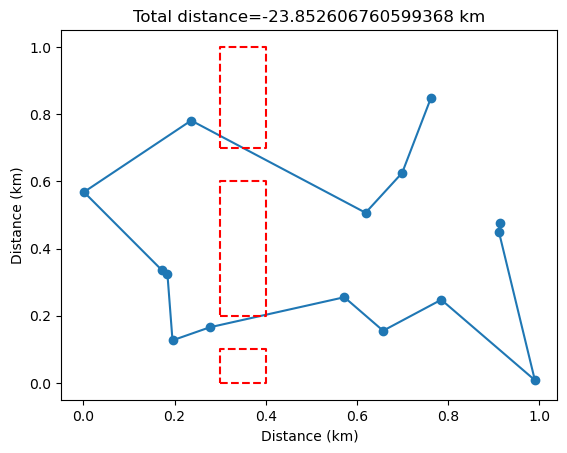

T=   0.00141 , distance=  -23.85261 , accepted steps= 23


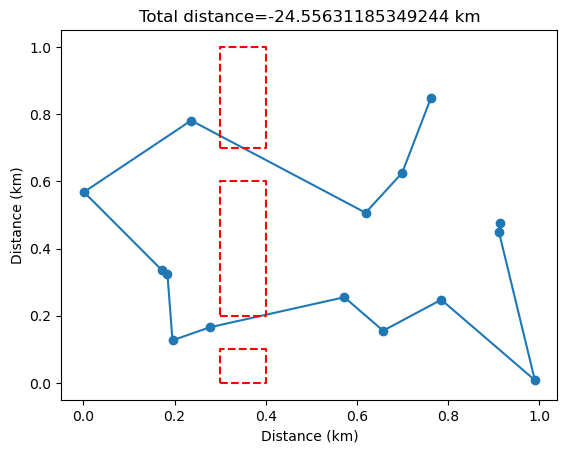

T=   0.00127 , distance=  -24.55631 , accepted steps= 22


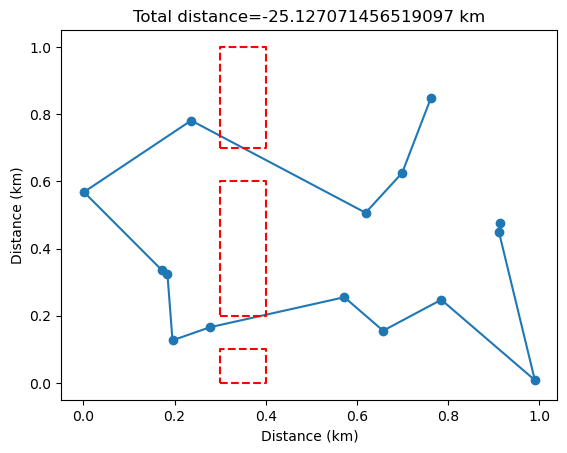

T=   0.00115 , distance=  -25.12707 , accepted steps= 20


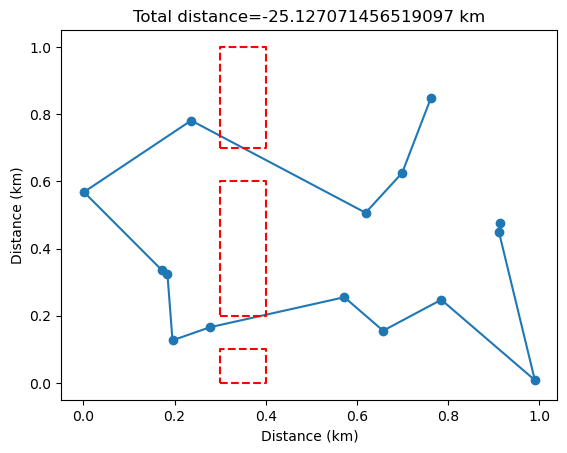

runTime:  68.45546102523804


<Figure size 640x480 with 0 Axes>

In [231]:
import time
from scipy import *
from pylab import *

start_time = time.time()

def Distance(R1, R2):
    return sqrt((R1[0] - R2[0]) ** 2 + (R1[1] - R2[1]) ** 2)

def TotalDistance(city, R):
    dist = 0
    for i in range(len(city) - 1):
        dist += Distance(R[city[i]], R[city[i + 1]])
    return dist

def CalculateObstaclePenalty(city, R, obstacles):
    obstacle_penalty = 0
    for i in range(len(city) - 1):
        for obstacle in obstacles:
            if LineIntersectsObstacle(R[city[i]], R[city[i + 1]], obstacle):
                obstacle_penalty += 1  # Increment obstacle penalty for each intersection
    return obstacle_penalty

def LineIntersectsObstacle(point1, point2, obstacle):
    x1, y1 = point1
    x2, y2 = point2
    x_min, y_min, x_max, y_max = obstacle
    # Check if the line segment intersects with the rectangle defined by obstacle
    return (
        (x_min <= x1 <= x_max or x_min <= x2 <= x_max) and
        (y_min <= y1 <= y_max or y_min <= y2 <= y_max) and
        (x1 - x2) * (y_min - y_max) != (x_min - x_max) * (y1 - y2)  # Check for intersection
    )

def IsCityInsideObstacles(new_city, obstacles):
    for obstacle in obstacles:
        x_min, y_min, x_max, y_max = obstacle
        if x_min <= new_city[0] <= x_max and y_min <= new_city[1] <= y_max:
            return True
    return False

def IsPathThroughObstacles(city, R, obstacles):
    for i in range(len(city) - 1):
        for obstacle in obstacles:
            if LineIntersectsObstacle(R[city[i]], R[city[i + 1]], obstacle):
                return True
    return False

def reverse(city, n):
    nct = len(city)
    nn = (1 + ((n[1] - n[0]) % nct)) / 2  
    inty = int(nn)
    for j in range(inty):
        k = (n[0] + j) % nct
        l = (n[1] - j) % nct
        city[k], city[l] = city[k], city[l]

def transpt(city, n):
    nct = len(city)
    newcity = []
    for j in range((n[1] - n[0]) % nct + 1):
        newcity.append(city[(j + n[0]) % nct])
    for j in range((n[2] - n[5]) % nct + 1):
        newcity.append(city[(j + n[5]) % nct])
    for j in range((n[4] - n[3]) % nct + 1):
        newcity.append(city[(j + n[3]) % nct])
    return newcity

COUNT = 0

def Plot(city, R, dist, obstacles):
    global COUNT
    Pt = [R[city[i]] for i in range(len(city))]
    Pt = array(Pt)
    title('Total distance=' + str(dist) + ' km')
    plot(Pt[:, 0], Pt[:, 1], '-o')
    for obstacle in obstacles:
        x_min, y_min, x_max, y_max = obstacle
        plt.plot([x_min, x_max, x_max, x_min, x_min], [y_min, y_min, y_max, y_max, y_min], 'r--')
    fig1 = gcf()
    plt.xlabel('Distance (km)')
    plt.ylabel('Distance (km)')
    plt.show()  # Display the plot before saving
    fig1.savefig('annealStep' + str(COUNT) + '.png')
    plt.clf()  # Clear the current figure after saving
    COUNT += 1

if __name__ == '__main__':
    ncity = 15  # Number of cities to visit
    maxTsteps = 50  # Temperature is lowered not more than maxTsteps
    Tstart = 0.2  # Starting temperature
    fCool = 0.9  # Factor to multiply temperature at each cooling step
    Preverse = 0.5  # Probability for reverse/transpose trial move
    convergence_threshold = 10  # Number of iterations with no change to consider convergence
    obstacle_penalty_factor = 100  # Factor to increase energy for paths crossing obstacles

    # Choosing city coordinates
    R = []  # Coordinates of cities are chosen randomly
    for i in range(ncity):
        while True:
            new_city = [rand(), rand()]
            if not IsCityInsideObstacles(new_city, obstacles) and not IsPathThroughObstacles([new_city], R, obstacles):
                R.append(new_city)
                break
    R = array(R)

    # Define your own obstacles as rectangles [x_min, y_min, x_max, y_max]
    my_obstacles = [
        [0.3, 0, 0.4, 0.1],  # Example obstacle 1
        [0.3, 0.2, 0.4, 0.6],   # Example obstacle 2
        [0.3, 0.7, 0.4, 1]
    ]

    # Pass your obstacles to the obstacles variable
    obstacles = my_obstacles

    # The index table -- the order the cities are visited.
    ncity = len(R)
    maxSteps = 100 * ncity  # Number of steps at constant temperature
    maxAccepted = 10 * ncity  # Number of accepted steps at constant temperature

    city = list(range(ncity))

    # Distance of the travel at the beginning
    dist = TotalDistance(city, R)
    dist = round(dist, 5)

    # Stores points of a move
    n = zeros(6, dtype=int)
    nct = len(R)  # Number of cities

    T = Tstart  # Temperature

    Plot(city, R, dist, obstacles)

    # Track previous distance to check for convergence
    prev_dist = dist
    unchanged_count = 0  # Counter for consecutive iterations with no change

    for t in range(maxTsteps):  # Over temperature
        accepted = 0
        for i in range(maxSteps):  # At each temperature, many Monte Carlo steps
            while True:  # Will find two random cities sufficiently close by
                n[0] = int((nct) * rand())  # Select one city
                n[1] = int((nct - 1) * rand())  # Select another city, but not the same
                if n[1] >= n[0]:
                    n[1] += 1
                if n[1] < n[0]:
                    n[0], n[1] = n[1], n[0]  # Swap, because it must be: n[0]<n[1]
                nn = (n[0] + nct - n[1] - 1) % nct  # Number of cities not on the segment n[0]..n[1]
                if nn >= 3:
                    break

            n[2] = (n[0] - 1) % nct  # Index before n0
            n[3] = (n[1] + 1) % nct  # Index after n2

            if Preverse > rand():
                # Reverse a segment
                de = Distance(R[city[n[2]]], R[city[n[1]]]) + Distance(R[city[n[3]]], R[city[n[0]]]) - Distance(
                    R[city[n[2]]], R[city[n[0]]]) - Distance(R[city[n[3]]], R[city[n[1]]])

                # Calculate obstacle penalty
                obstacle_penalty = CalculateObstaclePenalty(city, R, obstacles)
                de += obstacle_penalty * obstacle_penalty_factor  # Add obstacle penalty to the change in distance

                # Metropolis acceptance criterion with obstacle penalty
                if de < 0 or exp(-de / T) > rand():  # Metropolis
                    accepted += 1
                    dist += de
                    reverse(city, n)
            else:
                # Transpose a segment
                nc = (n[1] + 1 + int(rand() * (nn - 1))) % nct  
                n[4] = nc
                n[5] = (nc + 1) % nct

                de = -Distance(R[city[n[1]]], R[city[n[3]]]) - Distance(R[city[n[0]]], R[city[n[2]]]) - Distance(
                    R[city[n[4]]], R[city[n[5]]])
                de += Distance(R[city[n[0]]], R[city[n[4]]]) + Distance(R[city[n[1]]], R[city[n[5]]]) + Distance(
                    R[city[n[2]]], R[city[n[3]]])

                # Calculate obstacle penalty
                obstacle_penalty = CalculateObstaclePenalty(city, R, obstacles)
                de += obstacle_penalty * obstacle_penalty_factor  # Add obstacle penalty to the change in distance

                # Metropolis acceptance criterion with obstacle penalty
                if de < 0 or exp(-de / T) > rand():  # Metropolis
                    accepted += 1
                    dist += de
                    city = transpt(city, n)

            if accepted > maxAccepted:
                break

        # Plot
        Plot(city, R, dist, obstacles)

        print("T=%10.5f , distance= %10.5f , accepted steps= %d" % (T, dist, accepted))

        # Check for convergence
        if dist == prev_dist:
            unchanged_count += 1
        else:
            unchanged_count = 0
        if unchanged_count >= convergence_threshold:  # If no change for 10 iterations, consider converged
            print("Converged after", t, "iterations.")
            break

        prev_dist = dist
        T *= fCool  # The system is cooled down

    Plot(city, R, dist, obstacles)

runTime = time.time() - start_time
print("runTime: ", runTime)
